In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
d_data = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/csv/OARensemble2021_deepmind.csv', index_col=0)
p_data = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/csv/OARensemble2021_pddca2.csv', index_col=0)
h_data = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/csv/OARensemble2021_hnscc3drt2.csv', index_col=0)
m_data = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/csv/OARensemble2021_hn1.csv', index_col=0)
s_data = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/csv/OARensemble2021_structseg.csv', index_col=0)
r_data = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/csv/OARensemble2021_corrected_01072022.csv', index_col=0)
t_data = pd.read_csv('tcia_hnscc_outputv1_corrected-3.csv', index_col=0)

In [4]:
s_data.head()

,OAR,OAR_STRUCT,Patient,VolDice,95HD,SurfDice
0,BSTEM,Brain_Stem,37,0.811656,3.000000,1.210259
1,SPCOR,Spinal_Cord,37,0.768913,2.449490,1.169939
2,MAND,Mandible_L,37,0.755658,6.403124,1.770572
3,LPAR,Parotid_Gland_L,37,0.876689,2.236068,0.771111
4,RPAR,Parotid_Gland_R,37,0.894852,2.236068,0.610314


In [5]:
####################################
####################################
###### OUTPUT CLINICAL DATA....
# clinical data stored here...
clinical = pd.read_csv("/Users/joemarsilla/Desktop/Thesis/Bratman-Radiomics-Definitive RT 2005-Aug2017-Dec 13'2018.csv")
clinical_tcia_hnscc = pd.read_csv("/Users/joemarsilla/Desktop/Thesis/TCIA - HNCTATLAS - Patient and Treatment Characteristics.csv")
test_info_tcia_hnscc = pd.read_csv("/Users/joemarsilla/Desktop/Thesis/csv/OAREnsemble20201_tcia_hnscc_outputv1.csv", index_col=0)
test_info = pd.read_csv("/Users/joemarsilla/Desktop/Thesis/OAR_radcure_test_set.csv", index_col=0)
clinical_tcia_hnscc3d = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/TCIA - HNSCC3DCT - MDPA Patient Data Final - Accepted.csv')
########
# input training/validation data to explain demographics of training set...
train_info = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/OAR_radcure_train_set.csv', index_col=0)
valid_info = pd.read_csv('/Users/joemarsilla/Desktop/Thesis/OAR_radcure_val_set.csv', index_col=0)

In [9]:
rois = ['MAND', 'LEYE', 'REYE', 'BSTEM', 'LARYNX', 'SPCOR', 'LPAR', 'RPAR', 'ESOPH', 'LLENS', 'RLENS', 'LACOU', 'RACOU', 'LPLEX', 'RPLEX', 'LIPS', 'LOPTIC', 'ROPTIC', 'CHIASM']

In [6]:
clinical_tcia_hnscc3d.head()

,HN_P,Age,Sex,Cancer Staging,PTV volume (cm3),Tumor Location,Prior Surgery,Performance Status,Chemotherapy Medication
0,1.0,64.0,M,IVA,93.50,Left base of the tongue and retromolar trigone,Biopsy was obtained from the left retromolar m...,ECOG 0-1,"Cisplatin, Cetuximab"
1,2.0,83.0,M,IVA,252.97,Right tonsil with cervical adenopathy,"Cataract surgery (both eyes), corneal transpla...",ECOG 0-1,"Carboplatin, Cetuximab"
2,3.0,87.0,M,IVA,133.77,Left base of the tongue,"Carpal tunnel release, Elbow surgery, knee sur...",ECOG 0-1,"Carboplatin, Cetuximab"
3,4.0,66.0,M,IVA,260.89,Left base of the tongue,Total hip arthroplasty.,ECOG 0-1,Erbitux
4,5.0,55.0,M,IVA,34.10,Base of tongue,Hemorrhoid surgery.,ECOG 0-1,Cisplatin


In [11]:
# clinical_filt
pats = list(h_data['Patient'])
pats = [int(p.split('_')[1].split('P')[1]) for p in pats]
sex = []
sex_n = []
obs = []
oar_idx = []
site = []
site_n = []

for i, pat in enumerate(pats):
    oar = h_data.iloc[i]['OAR']
    oar_idx.append(rois.index(oar))
    code = pats[i]
    dat = clinical_tcia_hnscc3d[clinical_tcia_hnscc3d['HN_P']==float(code)]
    obs.append('hn3dct_radiographer')
    se = str(dat['Sex'].iloc[0]).upper()
    if se == "F":
        sex.append("FEMALE")
        sex_n.append(1)
    else:
        sex.append("MALE")
        sex_n.append(0)

    st = str(dat['Tumor Location'].iloc[0]).upper()
    site.append(st)
#     if st not in site_:
#         site_n.append(5)
#     else:
#         for k,r in enumerate(site_):
#             if r==st:
#                 site_n.append(k)
            
#     t_ = str(dat['T'].iloc[0]).upper()
#     try:
#         t_stage.append(int(t_.lower().split('a')[0]))
#     except Exception as e:
#         print(e)
#         t_stage.append(0)

In [12]:
site_ = list(set(site))

In [13]:
site_

['BASE OF TONGUE ',
 'NASAL CAVITY',
 'RIGHT TONSIL WITH IPSILATERAL NODAL DISEASE',
 ' LEFT HARD PALATE',
 'RETROMOLAR TRIGONE',
 'LEFT BASE OF THE TONGUE AND RETROMOLAR TRIGONE',
 'RIGHT TONGUE BASE',
 'PARANASAL SINUS',
 'ANTERIOR FLOOR OF THE MOUTH',
 'LARYNX (RIGHT TRUE VOCAL CORD)',
 'LEFT TONSIL ',
 'OCCIPITAL SCALP ',
 'LEFT PAROTID GLAND',
 'LEFT LATERAL ORAL TONGUE/TONGUE BASE',
 'LYMPH NODES OF HEAD, FACE, AND NECK',
 'RIGHT TONSIL',
 'LARYNX',
 'ORAL TONGUE ',
 'RIGHT TONSIL WITH CERVICAL ADENOPATHY',
 'LEFT BASE OF THE TONGUE',
 'LEFT LATERAL BORDER OF THE TONGUE',
 'LARYNX- RIGHT TVC',
 'LEFT BASE OF THE TONGUE ',
 'RIGHT ORAL TONGUE',
 'OROPHARYNX ',
 'LEFT MANDIBLE',
 'LEFT BASE OF THE TONGUE, BOTH TONSILS WITH EXTENSIVE LYMPH NODE ']

In [14]:
h_data['Site']=site
h_data['Sex']=sex
h_data['Sex_F/M']=sex_n
h_data['Observer']=obs
h_data['OAR_idx']=oar_idx

In [15]:
h_data.head()

,OAR,Patient,VolDice,95HD,SurfDice,Site,Sex,Sex_F/M,Observer,OAR_idx
0,BSTEM,HN_P001_0,0.884096,3.162278,0.891206,LEFT BASE OF THE TONGUE AND RETROMOLAR TRIGONE,MALE,0,hn3dct_radiographer,3
1,SPCOR,HN_P001_0,0.812655,1.732051,0.931457,LEFT BASE OF THE TONGUE AND RETROMOLAR TRIGONE,MALE,0,hn3dct_radiographer,5
2,MAND,HN_P001_0,0.820791,5.000000,1.300482,LEFT BASE OF THE TONGUE AND RETROMOLAR TRIGONE,MALE,0,hn3dct_radiographer,0
3,LPAR,HN_P001_0,0.593148,12.806248,3.654126,LEFT BASE OF THE TONGUE AND RETROMOLAR TRIGONE,MALE,0,hn3dct_radiographer,6
4,RPAR,HN_P001_0,0.591432,9.899495,3.530060,LEFT BASE OF THE TONGUE AND RETROMOLAR TRIGONE,MALE,0,hn3dct_radiographer,7


In [282]:
# new_dic_ = pd.concat([new_dic, h_data])

In [43]:
h_data_up = h_data.drop(columns=["Sex_F/M", "OAR_idx"])

In [271]:
site_=list(set(site))

In [263]:
pats = list(h_data['Patient'])
pats = [int(p.split('_')[1].split('P')[1]) for p in pats]

In [265]:
len(pats)

788

In [16]:
clinical_tcia_hnscc.head()

,TCIA code,Sex,Age,Date of Birth,Diag,Site,Histology,Grade,T,N,...,Pre-RT Imaging Date,Pre-RT Imaging Modality,CT sim date,post-RT imaging date,post-RT imaging modality,Recurrence imaging date,Recurrence imaging modality,Additional imaging date,Additional imaging modality,Additional imaging notes
0,HNSCC-01-0001,Female,54,NaN,CA soft palate,Oropharynx,SCC,moderately to poorly diff.,2,2c,...,1998-12-01,PET/CT,1998-12-05,1999-03-27,PET/CT,NaN,NaN,NaN,NaN,NaN
1,HNSCC-01-0002,Female,56,NaN,NPC,Nasopharynx,SCC,moderately diff.,4,2,...,2001-10-01,PET/CT,2001-11-20,2003-12-03,PET/CT,2004-10-19,MRI Orbits,NaN,NaN,NaN
2,HNSCC-01-0003,Male,48,NaN,CA tonsil,Oropharynx,SCC,moderately diff.,2,2b,...,2001-10-30,PET/CT,2001-11-20,2002-06-09,PET/CT,NaN,NaN,NaN,NaN,NaN
3,HNSCC-01-0004,Male,65,NaN,CA tonsil,Oropharynx,SCC,poorly diff.,4a,2c,...,1996-08-28,PET/CT,1996-08-24,1997-05-11,PET/CT,NaN,NaN,NaN,NaN,NaN
4,HNSCC-01-0005,Male,66,NaN,CA tonsil,Oropharynx,SCC,moderately diff.,2,1,...,NaN,NaN,1998-01-19,2000-03-27,PET/CT,2000-03-27,PET/CT,NaN,NaN,NaN


In [17]:
test_info_tcia_hnscc.head()
pats = list(test_info_tcia_hnscc['Patient'])
pats = [p.split('_')[0] for p in pats]
clin_tcia_filt = clinical_tcia_hnscc[clinical_tcia_hnscc['TCIA code'].isin(pats)]

In [20]:
# clinical_filt
# pats = list(r_data['Patient'])
sex = []
sex_n = []
site = []
site_n = []
t_stage = []
obs = []
# smoke = []
# drink = []
# drink_n = []
# smoke_n = []
oar_idx = []
# t_n = []

for i, pat in enumerate(pats):
    oar = test_info_tcia_hnscc.iloc[i]['OAR']
    oar_idx.append(rois.index(oar))
    code = pats[i]
    dat = clin_tcia_filt[clin_tcia_filt['TCIA code']==code]
    obs.append('atlas_radiographer')
    se = str(dat['Sex'].iloc[0]).upper()
    sex.append(se)
    
    if se == "FEMALE":
        sex_n.append(1)
    else:
        sex_n.append(0)
    
    st = str(dat['Site'].iloc[0]).upper()
    site.append(st)
    if st not in site_:
        site_n.append(5)
    else:
        for k,r in enumerate(site_):
            if r==st:
                site_n.append(k)
            
    t_ = str(dat['T'].iloc[0]).upper()
    try:
        t_stage.append(int(t_.lower().split('a')[0]))
    except Exception as e:
        print(e)
        t_stage.append(0)
    # for j in range(5):
    #     if str(j) in t_:
    #         t_n.append(j)
    
#     sm = str(dat['Smoking Hx'].iloc[0]).upper()
#     smoke.append(sm)
#     dr = str(dat['Drinking hx'].iloc[0]).upper()
#     drink.append(dr)
    
#     if sm == "NON-SMOKER":
#         smoke_n.append(0)
#     else:
#         smoke_n.append(1)
    
#     if dr == 'NON-DRINKER':
#         drink_n.append(0)
#     else:
#         drink_n.append(1)

invalid literal for int() with base 10: 'in situ'
invalid literal for int() with base 10: 'in situ'
invalid literal for int() with base 10: 'in situ'
invalid literal for int() with base 10: 'in situ'
invalid literal for int() with base 10: 'in situ'


In [19]:
site_=list(set(site))

In [47]:
s_data['Observer'] = ['struct_radiographer' for s in range(len(s_data))]

In [22]:
test_info_tcia_hnscc['Sex']=sex
test_info_tcia_hnscc['Observer']=obs
test_info_tcia_hnscc['Sex_F/M'] = sex_n
test_info_tcia_hnscc['Site'] = site
test_info_tcia_hnscc['Site_n'] = site_n
test_info_tcia_hnscc['T_n']=t_stage
test_info_tcia_hnscc['OAR_idx']=oar_idx

In [261]:
test_info_tcia_hnscc.head()
test_info_tcia_hnscc.to_csv('/Users/joemarsilla/Desktop/Thesis/csv/OAREnsemble20201_tcia_hnscc_outputv1-WITH-CLINICAL.csv')

In [23]:
remove = ['Sex_F/M','Site_n', 'Patient', 'Patient_ID']
t_data = test_info_tcia_hnscc.drop(columns=remove)

In [24]:
t_data

,OAR,VolDice,95HD,SurfDice,Sex,Observer,Site,T_n,OAR_idx
0,BSTEM,0.744286,4.000000,1.861115,FEMALE,atlas_radiographer,NASOPHARYNX,4,3
1,SPCOR,0.608948,27.313001,6.274601,FEMALE,atlas_radiographer,NASOPHARYNX,4,5
2,MAND,0.730132,8.555668,2.030252,FEMALE,atlas_radiographer,NASOPHARYNX,4,0
3,LPAR,0.805042,4.242641,1.229553,FEMALE,atlas_radiographer,NASOPHARYNX,4,6
4,RPAR,0.792825,6.403124,1.156075,FEMALE,atlas_radiographer,NASOPHARYNX,4,7
...,...,...,...,...,...,...,...,...,...
777,LACOU,0.229469,12.041595,3.390726,MALE,atlas_radiographer,ORAL CAVITY,1,11
778,RACOU,0.308101,10.862780,3.538133,MALE,atlas_radiographer,ORAL CAVITY,1,12
779,BSTEM,0.257996,17.720045,9.482797,MALE,atlas_radiographer,OROPHARYNX,2,3
780,SPCOR,0.699345,7.000000,1.975679,MALE,atlas_radiographer,OROPHARYNX,2,5


In [40]:
remove = ['Volume','T', 'Drink Hx', 'Smoke Hx', 'Drink_y/n', 'Smoke_y/n', 'Site_n', 'Patient', 'Sex_F/M']
r_data_up = r_data.drop(columns=remove)

In [41]:
r_data_up.head()

,OAR,VolDice,95HD,SurfDice,Observer,Sex,Site,OAR_idx,T_n
0,BSTEM,0.850081,3.000000,1.134316,rc_radiologist,FEMALE,OROPHARYNX,3,3
1,SPCOR,0.827113,2.236068,1.092190,rc_radiologist,FEMALE,OROPHARYNX,5,3
2,ESOPH,0.833083,3.162278,1.103672,rc_radiologist,FEMALE,OROPHARYNX,8,3
3,LARYNX,0.895342,2.000000,0.853980,rc_radiologist,FEMALE,OROPHARYNX,4,3
4,MAND,0.951560,1.000000,0.346290,rc_radiologist,FEMALE,OROPHARYNX,0,3


In [63]:
new_dic = pd.concat([r_data_up, t_data, h_data_up,s_data[~s_data['OAR_STRUCT'].isin(['Mid_Ear_R', 'Mid_Ear_L'])]]) #s_data])

In [68]:
filt=['LACOU', 'RACOU']
a = s_data[s_data['OAR'].isin(filt)]
a_ = s_data[s_data['OAR_STRUCT'].isin(['Mid_Ear_R', 'Mid_Ear_L'])]

In [72]:
a_.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()

,OAR,VolDice,95HD,SurfDice
0,LACOU,0.046199,20.139504,2.504766
1,RACOU,0.050027,19.461485,2.619045


/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


Text(0, 0.5, '3D Volumetric Dice\n')

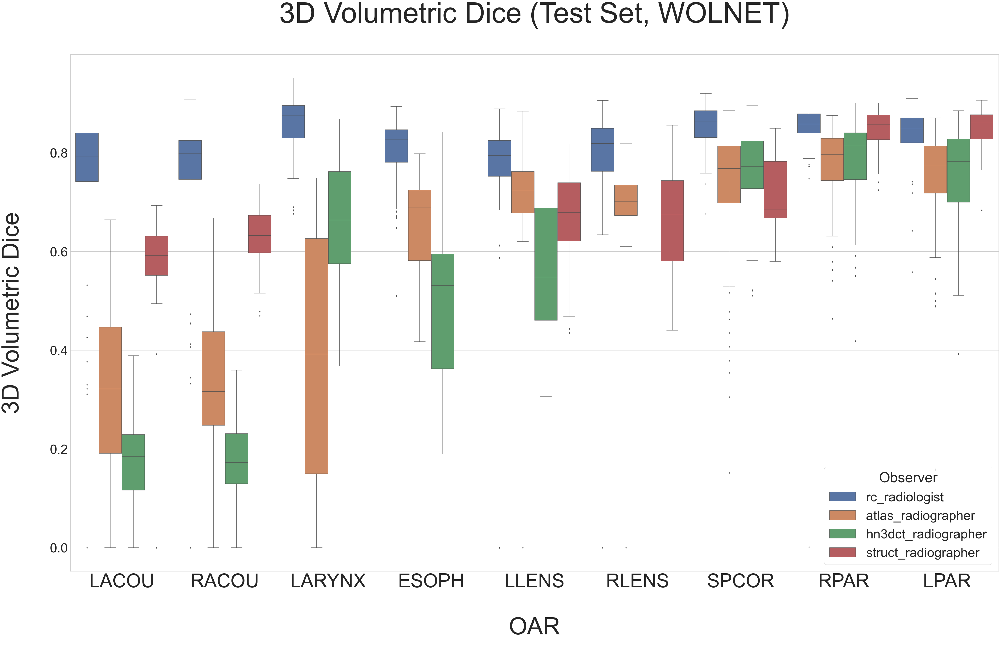

In [64]:
import seaborn as sea
import numpy as np
data_ = new_dic.copy()
# CORRECTED ENSEMBLE
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('3D Volumetric Dice (Test Set, WOLNET)\n', fontsize=120)
# rois = ['MAND', 'LEYE', 'REYE', 'BSTEM', 'LARYNX', 'SPCOR', 'LPAR', 'RPAR', 'ESOPH', 'LLENS', 'RLENS', 'LACOU', 'RACOU', 'LPLEX', 'RPLEX', 'LIPS', 'LOPTIC', 'ROPTIC', 'CHIASM']
roi_select = ['LACOU', 'RACOU', "LARYNX", "ESOPH", 'LLENS', 'RLENS', 'SPCOR', 'RPAR', 'LPAR', ]
data_.OAR = data_.OAR.astype("category")
data_.OAR.cat.set_categories(roi_select, inplace=True)
data_.sort_values(["OAR"])
# medians = data_.groupby(['OAR'])['VolDice'].median()
# vertical_offset = data_['VolDice'].median() * 0.15 # offset from median for display

ax = sea.boxplot(data=data_[data_.OAR.isin(roi_select)], x="OAR", y="VolDice", hue="Observer", width=.9)
ax.set_xticklabels(roi_select, fontsize=80)
# for xtick in ax.get_xticks():
#     ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
#             horizontalalignment='center',size='x-large',color='k',weight='semibold')
ax.set(xlabel='\nOAR\n', ylabel='3D Volumetric Dice\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('3D Volumetric Dice\n', fontsize=100)
# ax.legend_.remove()

/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/1296552879.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), size = 100)


Text(0, 0.5, '95%HD\n')

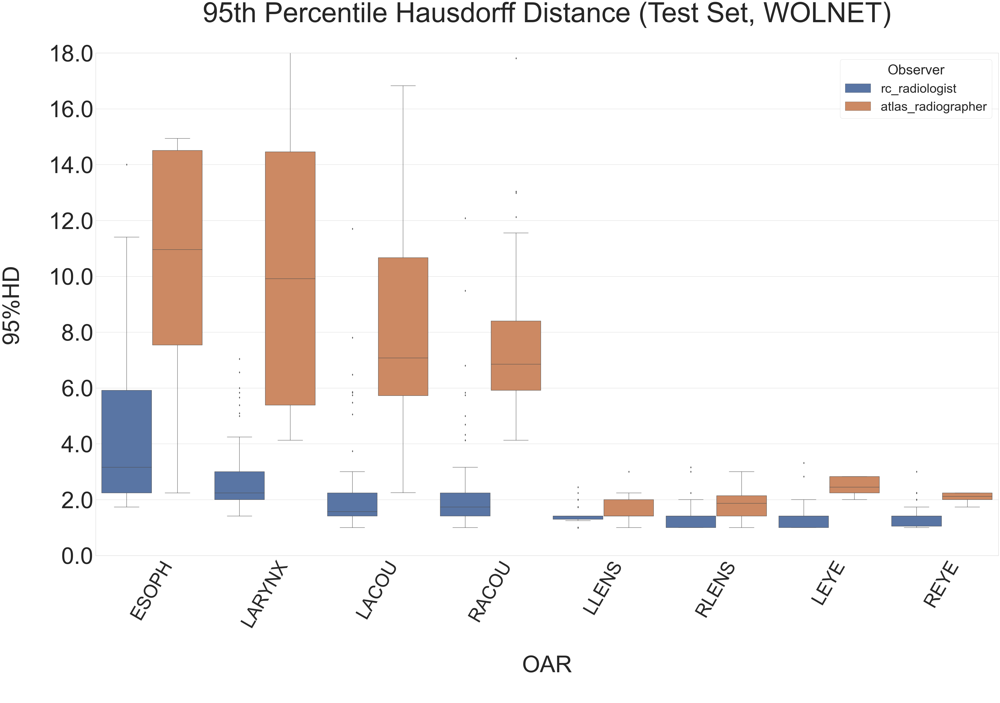

In [240]:
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('95th Percentile Hausdorff Distance (Test Set, WOLNET)\n', fontsize=120)
ax = sea.boxplot(data=data_[data_.OAR.isin(roi_select)], x="OAR", y="95HD", hue="Observer", width=.9,)
ax.set_ylim(0,18)
ax.set_yticklabels(ax.get_yticks(), size = 100)
# ax.set_xticklabels(rois, rotation=60, fontsize=80)
# ylabels = ['{:,.0f}'.format(x) for x in ax.get_yticks()]
# ax.set_yticklabels(ylabels)
plt.xticks(rotation=60, fontsize=80)
medians = data_.groupby(['OAR'])['95HD'].median()
vertical_offset = data_['95HD'].median() * 1.65 # offset from median for display
# for xtick in ax.get_xticks():
#     ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
#             horizontalalignment='center',size='x-large',color='k',weight='semibold')
# ax.set(xlabel='\nOAR\n', ylabel='95%HD\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('95%HD\n', fontsize=100)
# ax.legend_.remove()

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 61.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 77.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 79.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 79.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: Us

(0.0, 18.0)

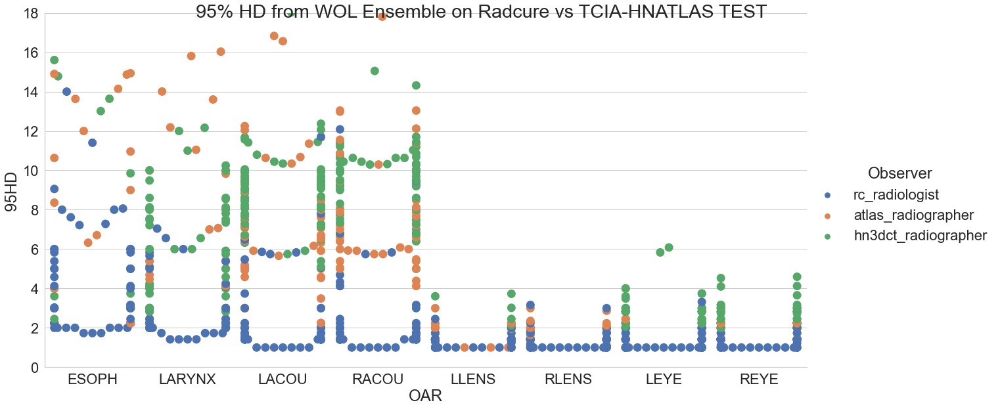

In [284]:
data_ = new_dic_.copy()
# CORRECTED ENSEMBLE
# sns.catplot(x="day", y="total_bill", hue="sex", kind="swarm", data=tips)
# plt.figure(figsize=(70,40))
sea.set(font_scale=2)  # crazy big
sea.set_style("whitegrid")
ax = sea.catplot(data=data_[data_.OAR.isin(roi_select)], x="OAR", y="95HD", hue="Observer", kind="swarm", height=9, aspect=2, s = 13)
ax.fig.suptitle('95% HD from WOL Ensemble on Radcure vs TCIA-HNATLAS TEST \n')
plt.ylim(0,18)

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 17.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 15.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg,

Text(0.5, 0.98, '3D Volumetric Dice from WOL Ensemble for select OARs \n')

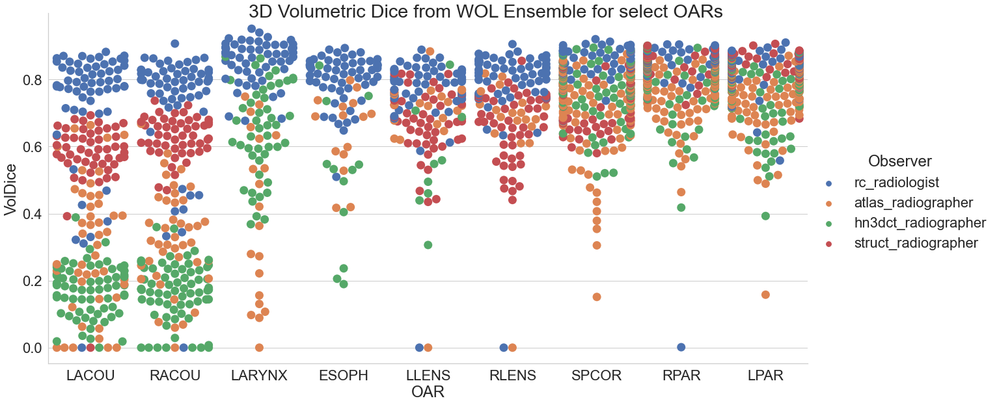

In [66]:
data_ = new_dic.copy()
# CORRECTED ENSEMBLE
# sns.catplot(x="day", y="total_bill", hue="sex", kind="swarm", data=tips)
# plt.figure(figsize=(70,40))
roi_select = ['LACOU', 'RACOU', "LARYNX", "ESOPH", 'LLENS', 'RLENS', 'SPCOR', 'RPAR', 'LPAR', ]
data_.OAR = data_.OAR.astype("category")
data_.OAR.cat.set_categories(roi_select, inplace=True)
data_.sort_values(["OAR"])
sea.set(font_scale=2)  # crazy big
sea.set_style("whitegrid")
ax = sea.catplot(data=data_[data_.OAR.isin(roi_select)], x="OAR", y="VolDice", hue="Observer", kind="swarm", height=9, aspect=2, s = 13)
ax.fig.suptitle('3D Volumetric Dice from WOL Ensemble for select OARs \n')

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 16.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 18.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 10.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 13.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: Us

Text(0.5, 0.98, '3D Volumetric Dice from WOL Ensemble on Radcure TEST \n')

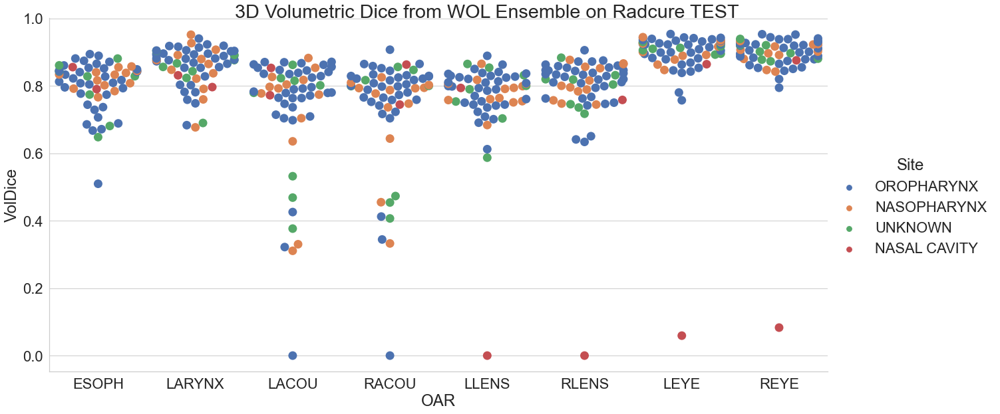

In [246]:
import seaborn as sea
import numpy as np
data_ = r_data.copy()
# CORRECTED ENSEMBLE
# sns.catplot(x="day", y="total_bill", hue="sex", kind="swarm", data=tips)
# plt.figure(figsize=(70,40))
sea.set(font_scale=2)  # crazy big
sea.set_style("whitegrid")
ax = sea.catplot(data=data_[data_.OAR.isin(roi_select)], x="OAR", y="VolDice", hue="Site", kind="swarm", height=9, aspect=2, s = 13)
ax.fig.suptitle('3D Volumetric Dice from WOL Ensemble on Radcure TEST \n')
# sea.color_palette("Set2")
# plt.title('3D Volumetric Dice (Test Set, WOLNET)\n', fontsize=120)
# rois = ['MAND', 'LEYE', 'REYE', 'BSTEM', 'LARYNX', 'SPCOR', 'LPAR', 'RPAR', 'ESOPH', 'LLENS', 'RLENS', 'LACOU', 'RACOU', 'LPLEX', 'RPLEX', 'LIPS', 'LOPTIC', 'ROPTIC', 'CHIASM']
# data_.OAR = data_.OAR.astype("category")
# data_.OAR.cat.set_categories(rois, inplace=True)
# data_.sort_values(["OAR"])
# medians = data_.groupby(['OAR'])['VolDice'].median()
# vertical_offset = data_['VolDice'].median() * 0.15 # offset from median for display
# ax.set_xticklabels(rois, fontsize=80)
# for xtick in ax.get_xticks():
#     ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
#             horizontalalignment='center',size='x-large',color='k',weight='semibold')
# ax.set(xlabel='\nOAR\n', ylabel='3D Volumetric Dice\n')
# ax.set_xlabel('\nOAR\n', fontsize=100)
# ax.set_ylabel('3D Volumetric Dice\n', fontsize=100)
# ax.legend_.loc('best')

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 55.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 47.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 40.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg,

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]),
 [Text(0, 0, 'MAND'),
  Text(1, 0, 'LEYE'),
  Text(2, 0, 'REYE'),
  Text(3, 0, 'BSTEM'),
  Text(4, 0, 'LARYNX'),
  Text(5, 0, 'SPCOR'),
  Text(6, 0, 'LPAR'),
  Text(7, 0, 'RPAR'),
  Text(8, 0, 'ESOPH'),
  Text(9, 0, 'LLENS'),
  Text(10, 0, 'RLENS'),
  Text(11, 0, 'LACOU'),
  Text(12, 0, 'RACOU'),
  Text(13, 0, 'LPLEX'),
  Text(14, 0, 'RPLEX'),
  Text(15, 0, 'LIPS'),
  Text(16, 0, 'LOPTIC'),
  Text(17, 0, 'ROPTIC'),
  Text(18, 0, 'CHIASM')])

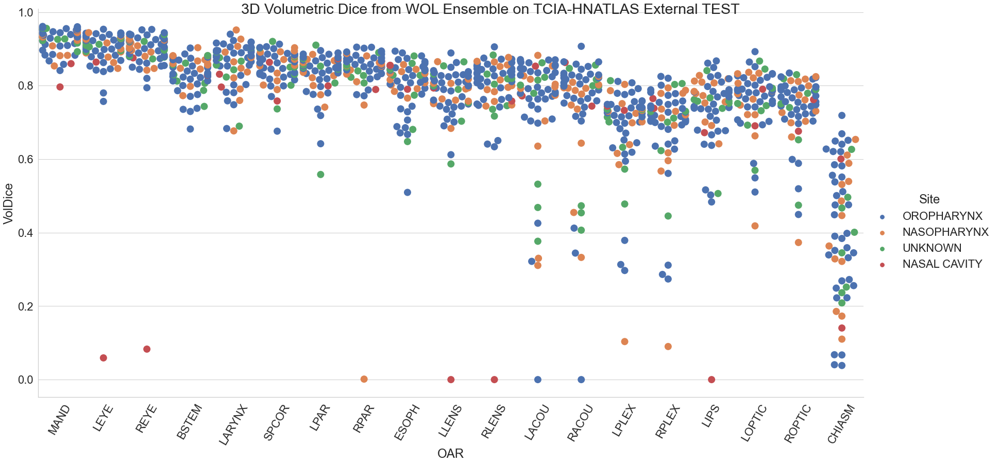

In [233]:
data_ = r_data.copy()
# CORRECTED ENSEMBLE
# sns.catplot(x="day", y="total_bill", hue="sex", kind="swarm", data=tips)
# plt.figure(figsize=(70,40))
sea.set(font_scale=2)  # crazy big
sea.set_style("whitegrid")
data_.OAR = data_.OAR.astype("category")
data_.OAR.cat.set_categories(rois, inplace=True)
data_.sort_values(["OAR"])
ax = sea.catplot(data=data_, x="OAR", y="VolDice", hue="Site", kind="swarm", height=12, aspect=2, s = 14)
ax.fig.suptitle('3D Volumetric Dice from WOL Ensemble on TCIA-HNATLAS External TEST \n')
# ax.fig.set_xticklabels(roi_select, rotation=60, fontsize=80)
plt.xticks(rotation=60)

Text(0.5, 0.98, '3D Volumetric Dice from WOL Ensemble on TCIA-HNATLAS External TEST \n')

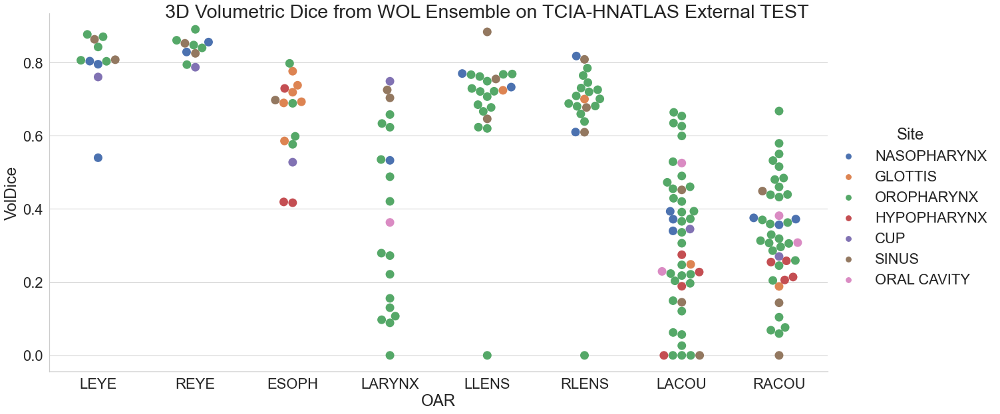

In [247]:
data_ = t_data.copy()
# CORRECTED ENSEMBLE
# sns.catplot(x="day", y="total_bill", hue="sex", kind="swarm", data=tips)
# plt.figure(figsize=(70,40))
sea.set(font_scale=2)  # crazy big
sea.set_style("whitegrid")
ax = sea.catplot(data=data_[data_.OAR.isin(roi_select)], x="OAR", y="VolDice", hue="Site", kind="swarm", height=9, aspect=2, s = 13)
ax.fig.suptitle('3D Volumetric Dice from WOL Ensemble on TCIA-HNATLAS External TEST \n')

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 21.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 21.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg,

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]),
 [Text(0, 0, 'MAND'),
  Text(1, 0, 'LEYE'),
  Text(2, 0, 'REYE'),
  Text(3, 0, 'BSTEM'),
  Text(4, 0, 'LARYNX'),
  Text(5, 0, 'SPCOR'),
  Text(6, 0, 'LPAR'),
  Text(7, 0, 'RPAR'),
  Text(8, 0, 'ESOPH'),
  Text(9, 0, 'LLENS'),
  Text(10, 0, 'RLENS'),
  Text(11, 0, 'LACOU'),
  Text(12, 0, 'RACOU'),
  Text(13, 0, 'LPLEX'),
  Text(14, 0, 'RPLEX'),
  Text(15, 0, 'LIPS'),
  Text(16, 0, 'LOPTIC'),
  Text(17, 0, 'ROPTIC'),
  Text(18, 0, 'CHIASM')])

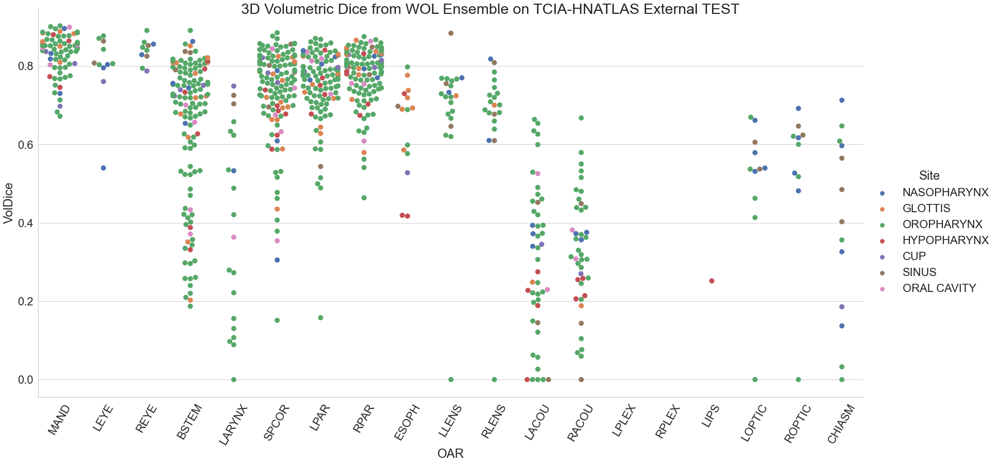

In [228]:
data_ = t_data.copy()
# CORRECTED ENSEMBLE
# sns.catplot(x="day", y="total_bill", hue="sex", kind="swarm", data=tips)
# plt.figure(figsize=(70,40))
sea.set(font_scale=2)  # crazy big
sea.set_style("whitegrid")
data_.OAR = data_.OAR.astype("category")
data_.OAR.cat.set_categories(rois, inplace=True)
data_.sort_values(["OAR"])
ax = sea.catplot(data=data_, x="OAR", y="VolDice", hue="Site", kind="swarm", height=12, aspect=2, s = 10)
ax.fig.suptitle('3D Volumetric Dice from WOL Ensemble on TCIA-HNATLAS External TEST \n')
# ax.fig.set_xticklabels(roi_select, rotation=60, fontsize=80)
plt.xticks(rotation=60)

/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/522936089.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), size = 100)
/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/522936089.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabels)


Text(0, 0.5, '95%HD\n')

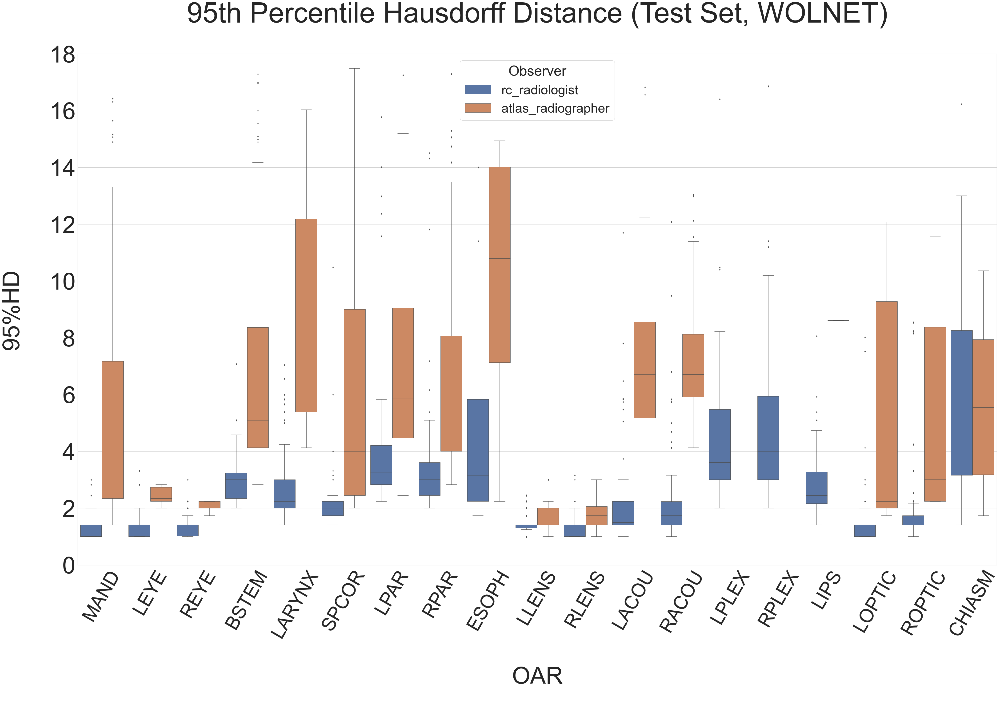

In [154]:
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('95th Percentile Hausdorff Distance (Test Set, WOLNET)\n', fontsize=120)
ax = sea.boxplot(data=data_[data_["95HD"]<17.5], x="OAR", y="95HD", hue="Observer", width=.9,)
ax.set_ylim(0,18)
ax.set_yticklabels(ax.get_yticks(), size = 100)
ax.set_xticklabels(rois, rotation=60, fontsize=80)
ylabels = ['{:,.0f}'.format(x) for x in ax.get_yticks()]
ax.set_yticklabels(ylabels)
medians = data_.groupby(['OAR'])['95HD'].median()
vertical_offset = data_['95HD'].median() * 1.65 # offset from median for display
# for xtick in ax.get_xticks():
#     ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
#             horizontalalignment='center',size='x-large',color='k',weight='semibold')
# ax.set(xlabel='\nOAR\n', ylabel='95%HD\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('95%HD\n', fontsize=100)
# ax.legend_.remove()

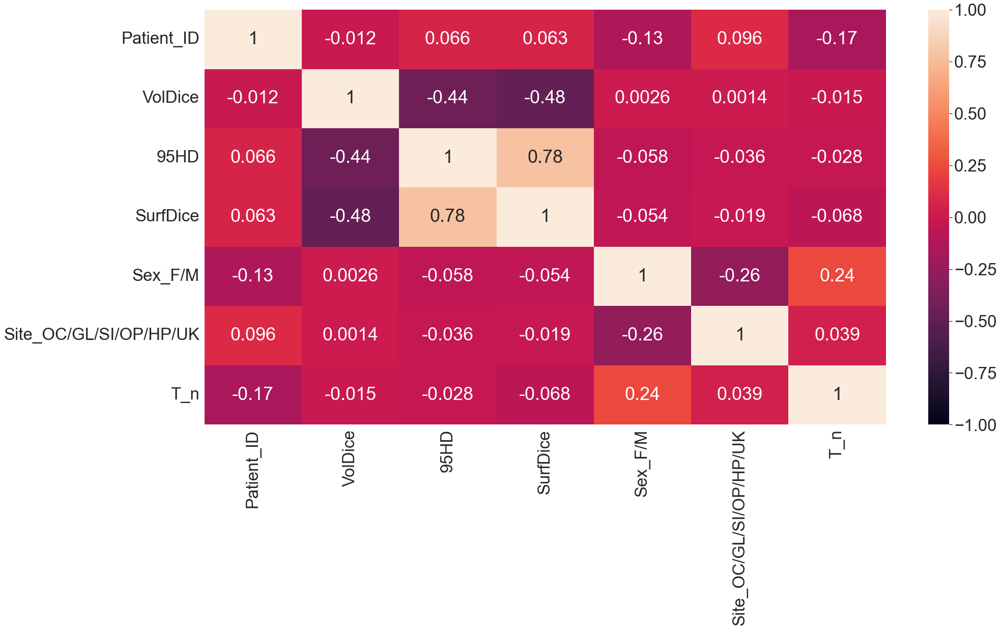

In [125]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.heatmap(test_info_tcia_hnscc.corr(), vmin=-1, vmax=1, annot=True);

In [128]:
test_info_tcia_hnscc

,OAR,Patient_ID,Patient,VolDice,95HD,SurfDice,Sex,Sex_F/M,Site,Site_OC/GL/SI/OP/HP/UK,T_n
0,BSTEM,100,HNSCC-01-0018_2,0.744286,4.000000,1.861115,FEMALE,1,NASOPHARYNX,1,4
1,SPCOR,100,HNSCC-01-0018_2,0.608948,27.313001,6.274601,FEMALE,1,NASOPHARYNX,1,4
2,MAND,100,HNSCC-01-0018_2,0.730132,8.555668,2.030252,FEMALE,1,NASOPHARYNX,1,4
3,LPAR,100,HNSCC-01-0018_2,0.805042,4.242641,1.229553,FEMALE,1,NASOPHARYNX,1,4
4,RPAR,100,HNSCC-01-0018_2,0.792825,6.403124,1.156075,FEMALE,1,NASOPHARYNX,1,4
...,...,...,...,...,...,...,...,...,...,...,...
777,LACOU,98,HNSCC-01-0036_0,0.229469,12.041595,3.390726,MALE,0,ORAL CAVITY,5,1
778,RACOU,98,HNSCC-01-0036_0,0.308101,10.862780,3.538133,MALE,0,ORAL CAVITY,5,1
779,BSTEM,99,HNSCC-01-0071_1,0.257996,17.720045,9.482797,MALE,0,OROPHARYNX,3,2
780,SPCOR,99,HNSCC-01-0071_1,0.699345,7.000000,1.975679,MALE,0,OROPHARYNX,3,2


In [127]:
list(set(test_info_tcia_hnscc['OAR']))

['SPCOR',
 'LEYE',
 'ROPTIC',
 'REYE',
 'LOPTIC',
 'LIPS',
 'LACOU',
 'BSTEM',
 'RPAR',
 'ESOPH',
 'LARYNX',
 'RLENS',
 'LPAR',
 'CHIASM',
 'RACOU',
 'MAND',
 'LLENS']

In [116]:
site_ = list(set(site))

['ORAL CAVITY',
 'GLOTTIS',
 'NASOPHARYNX',
 'SINUS',
 'OROPHARYNX',
 'HYPOPHARYNX',
 'CUP']

In [108]:
len(list(set(pats)))

132

In [28]:
# clinical.head() # MRN
testing_mrns = list(test_info['2'])
training_mrns = list(train_info['2'])
valid_mrns = list(valid_info['2'])

In [53]:
train_clinical = clinical[clinical.MRN.isin(training_mrns+valid_mrns)]
test_clinical = clinical[clinical.MRN.isin(testing_mrns)]

In [30]:
clinical_filt.describe()

NameError: name 'clinical_filt' is not defined

In [296]:
train_clinical.head()

,MRN,Age,Sex,ECOG PS,Smoking PY,Smoking Hx,Drinking hx,Ds Site,Subsite,T,...,Date Local,Regional,Date Regional,Distant,Date Distant,2nd Ca,Date 2nd Ca,1st G3-4 Late Tox,Date 1st G3-4 Late Tox,Type of 1st G3-4 Late Tox
1457,3798614,50.7,Male,ECOG 0,na,unknown,unknown,Nasopharynx,post wall,T2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1474,3801895,52.2,Male,ECOG 1,8,Current,non-drinker,Nasopharynx,NaN,T3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,02-24-2015,hearing loss /Tinitis
1667,2107427,46.5,Male,ECOG 0,6,Current,non-drinker,Nasopharynx,lat wall,T2,...,NaN,Yes,08-25-2011,NaN,NaN,NaN,NaN,Yes,10-14-2014,Other
1680,3309897,61.4,Male,ECOG 0,45,Current,Moderate,Nasopharynx,NaN,T4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,09-19-2012,Soft Tissue Fibrosis/Necrosis
1811,3885284,36.9,Male,Unknown,0,Non-smoker,non-drinker,Nasopharynx,NaN,T4,...,NaN,NaN,NaN,Yes,02-09-2011,NaN,NaN,NaN,NaN,NaN


In [315]:
clinical_filt.value_counts(['Sex'])

Sex   
Male      48
Female    11
dtype: int64

In [316]:
clinical_filt.value_counts(['Ds Site'])

Ds Site     
Oropharynx      36
Nasopharynx     13
Unknown          8
Nasal Cavity     1
nasal cavity     1
dtype: int64

In [317]:
clinical_filt.value_counts(['ECOG PS'])

ECOG PS  
ECOG 0       36
ECOG 1       20
ECOG 2        2
ECOG-Pt 1     1
dtype: int64

In [54]:
test_clinical.value_counts(['T'])

T  
T3     17
T2     12
T1     11
T0      8
T4a     8
T4      3
dtype: int64

In [312]:
clinical_filt.value_counts(['T', 'Ds Site','Sex']).to_csv('/Users/joemarsilla/Desktop/Thesis/csv/CLIN_OAR_testing_summary.csv')

In [311]:
train_clinical.value_counts(['T', 'Ds Site','Sex']).to_csv('/Users/joemarsilla/Desktop/Thesis/csv/CLIN_OAR_training_summary.csv')

In [19]:
clinical.head()

,index,0,1,2,3
0,2,/cluster/projects/radiomics/Temp/OARS050120/ma...,"(55.92988562164413, 203.78392374956562, 235.67...",4062832,[2.1781288e+07 1.4394000e+04 0.0000000e+00 7.6...
1,4,/cluster/projects/radiomics/Temp/OARS050120/ma...,"(90.35304584670637, 199.62020021859024, 251.86...",847536,[3.1983295e+07 2.7050000e+03 4.0514100e+05 8.3...
2,24,/cluster/projects/radiomics/Temp/OARS050120/ma...,"(79.98151037791084, 201.48446766588572, 250.83...",4363997,[3.3666575e+07 0.0000000e+00 4.4273800e+05 7.7...
3,27,/cluster/projects/radiomics/Temp/OARS050120/ma...,"(78.47774141639135, 225.72533900211886, 308.76...",3848142,[4.129994e+07 7.580000e+02 2.992640e+05 7.6080...
4,35,/cluster/projects/radiomics/Temp/OARS050120/ma...,"(88.67962789368677, 208.74377086612594, 227.90...",2571920,[2.7060197e+07 1.1010000e+03 3.9826800e+05 8.0...


In [25]:
clinical_filt = clinical[clinical.MRN.isin(testing_mrns)]

NameError: name 'testing_mrns' is not defined

In [82]:
rois = ['MAND', 'LEYE', 'REYE', 'BSTEM', 'LARYNX', 'SPCOR', 'LPAR', 'RPAR', 'ESOPH', 'LLENS', 'RLENS', 'LACOU', 'RACOU', 'LPLEX', 'RPLEX', 'LIPS', 'LOPTIC', 'ROPTIC', 'CHIASM']

0

In [33]:
# clinical_filt
pats = list(r_data['Patient'])
sex = []
site = []
t_stage = []
smoke = []
drink = []
drink_n = []
smoke_n = []
oar_idx = []
t_n = []
sex_n = []
site_n = []
for i, pat in enumerate(pats):
    oar = r_data.iloc[i]['OAR']
    oar_idx.append(rois.index(oar))
    mrn = testing_mrns[pat]
    dat = clinical[clinical['MRN']==mrn]
    
    se = str(dat['Sex'].iloc[0]).upper()
    sex.append(se)
    
    if se == "FEMALE":
        sex_n.append(1)
    else:
        sex_n.append(0)
    
    st = str(dat['Ds Site'].iloc[0]).upper()
    site.append(st)
    for k,r in enumerate(site_):
        if r==st:
            site_n.append(k)
            
    t_ = str(dat['T'].iloc[0]).upper()
    t_stage.append(t_)
    for j in range(5):
        if str(j) in t_:
            t_n.append(j)
    
    sm = str(dat['Smoking Hx'].iloc[0]).upper()
    smoke.append(sm)
    dr = str(dat['Drinking hx'].iloc[0]).upper()
    drink.append(dr)
    
    if sm == "NON-SMOKER":
        smoke_n.append(0)
    else:
        smoke_n.append(1)
    
    if dr == 'NON-DRINKER':
        drink_n.append(0)
    else:
        drink_n.append(1)

In [34]:
drink_ = list(set(drink))
smoke_ = list(set(smoke))
t_ = list(set(t_stage))
site_ = list(set(site))

In [35]:
r_data.head()

,OAR,Patient,VolDice,95HD,SurfDice,Volume,Observer
0,BSTEM,0,0.850081,3.000000,1.134316,40564.0,rc_radiologist
1,SPCOR,0,0.827113,2.236068,1.092190,40662.0,rc_radiologist
2,ESOPH,0,0.833083,3.162278,1.103672,19698.0,rc_radiologist
3,LARYNX,0,0.895342,2.000000,0.853980,41646.0,rc_radiologist
4,MAND,0,0.951560,1.000000,0.346290,86006.0,rc_radiologist


In [36]:
r_data['Sex']=sex
r_data['Site']=site
r_data['T']=t_stage
r_data['Drink Hx']=drink
r_data['Smoke Hx']=smoke
r_data['OAR_idx']=oar_idx
r_data['T_n']=t_n
r_data['Drink_y/n']=drink_n
r_data['Smoke_y/n']=smoke_n
r_data['Sex_F/M']=sex_n
r_data['Site_n']=site_n

In [37]:
len(r_data[r_data['Site']=="NASAL CAVITY"])

38

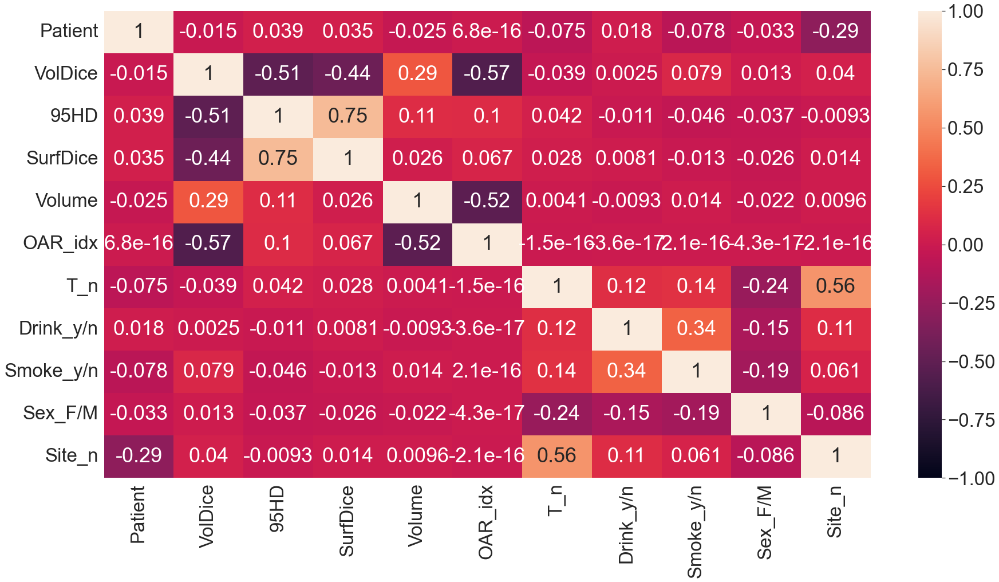

In [325]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.heatmap(r_data.corr(), vmin=-1, vmax=1, annot=True);

In [110]:
r_data.to_csv("/Users/joemarsilla/Desktop/Thesis/csv/OARensemble2021_corrected_01072022_w_clinical.csv")
#################################
#################################
#################################

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


Text(0, 0.5, '3D Volumetric Dice\n')

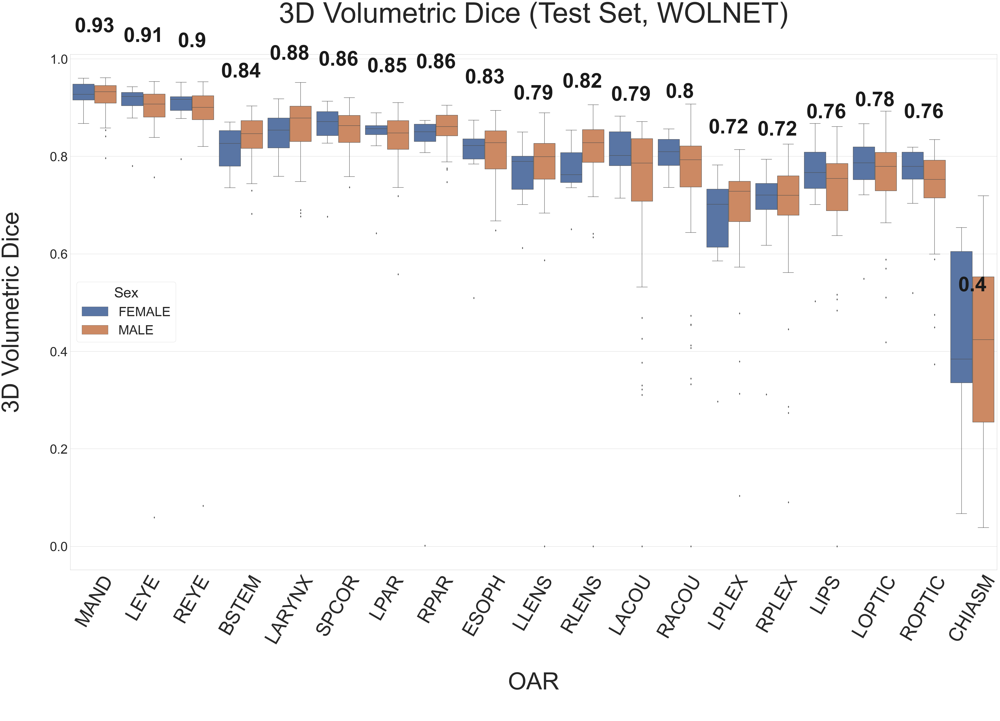

In [58]:
import seaborn as sea
import numpy as np
data_ = r_data.copy()
# CORRECTED ENSEMBLE
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('3D Volumetric Dice (Test Set, WOLNET)\n', fontsize=120)
rois = ['MAND', 'LEYE', 'REYE', 'BSTEM', 'LARYNX', 'SPCOR', 'LPAR', 'RPAR', 'ESOPH', 'LLENS', 'RLENS', 'LACOU', 'RACOU', 'LPLEX', 'RPLEX', 'LIPS', 'LOPTIC', 'ROPTIC', 'CHIASM']
data_.OAR = data_.OAR.astype("category")
data_.OAR.cat.set_categories(rois, inplace=True)
data_.sort_values(["OAR"])
medians = data_.groupby(['OAR'])['VolDice'].median()
vertical_offset = data_['VolDice'].median() * 0.15 # offset from median for display
ax = sea.boxplot(data=data_, x="OAR", y="VolDice", hue="Sex", width=.9)
ax.set_xticklabels(rois, rotation=60, fontsize=80)
for xtick in ax.get_xticks():
    ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
            horizontalalignment='center',size='x-large',color='k',weight='semibold')
ax.set(xlabel='\nOAR\n', ylabel='3D Volumetric Dice\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('3D Volumetric Dice\n', fontsize=100)
# ax.legend_.remove()

/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/3362891996.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), size = 100)
/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/3362891996.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabels)


Text(0, 0.5, '95%HD\n')

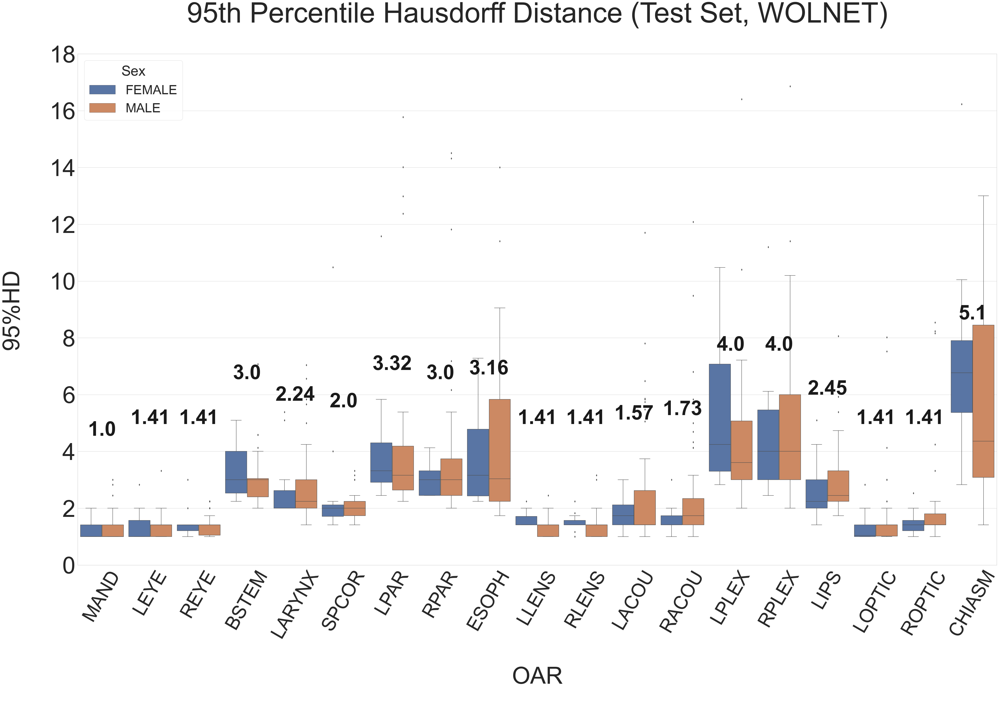

In [65]:
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('95th Percentile Hausdorff Distance (Test Set, WOLNET)\n', fontsize=120)
ax = sea.boxplot(data=data_[data_["95HD"]<17.5], x="OAR", y="95HD", hue="Sex", width=.9,)
ax.set_ylim(0,18)
ax.set_yticklabels(ax.get_yticks(), size = 100)
ax.set_xticklabels(rois, rotation=60, fontsize=80)
ylabels = ['{:,.0f}'.format(x) for x in ax.get_yticks()]
ax.set_yticklabels(ylabels)
medians = data_.groupby(['OAR'])['95HD'].median()
vertical_offset = data_['95HD'].median() * 1.65 # offset from median for display
for xtick in ax.get_xticks():
    ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
            horizontalalignment='center',size='x-large',color='k',weight='semibold')
# ax.set(xlabel='\nOAR\n', ylabel='95%HD\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('95%HD\n', fontsize=100)
# ax.legend_.remove()

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


Text(0, 0.5, '3D Volumetric Dice\n')

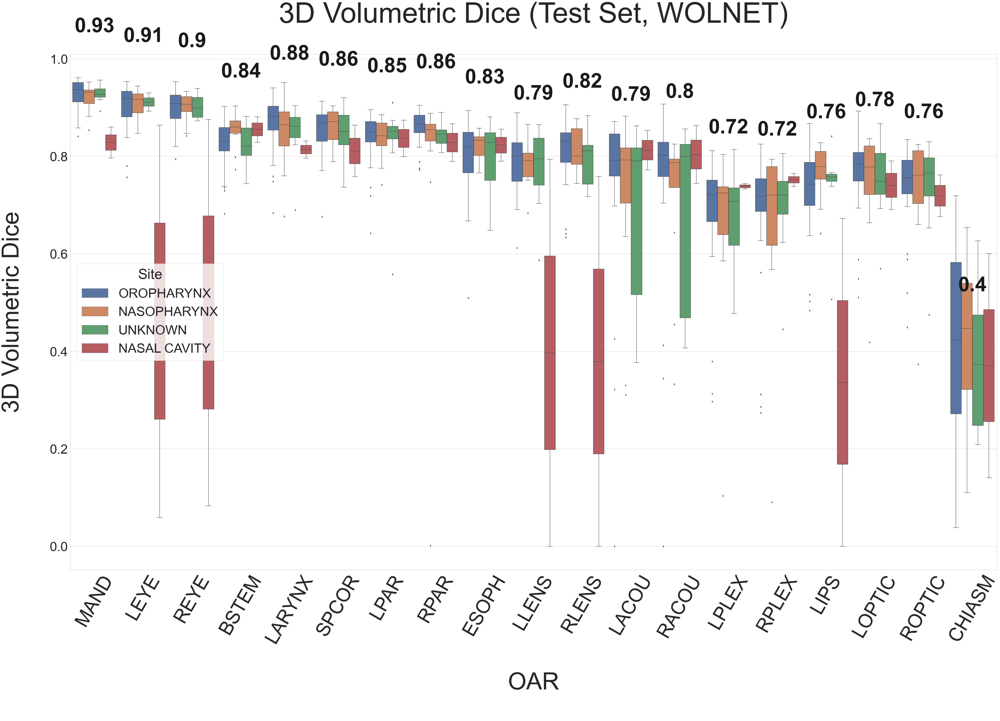

In [59]:
import seaborn as sea
import numpy as np
data_ = r_data.copy()
# CORRECTED ENSEMBLE
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('3D Volumetric Dice (Test Set, WOLNET)\n', fontsize=120)
rois = ['MAND', 'LEYE', 'REYE', 'BSTEM', 'LARYNX', 'SPCOR', 'LPAR', 'RPAR', 'ESOPH', 'LLENS', 'RLENS', 'LACOU', 'RACOU', 'LPLEX', 'RPLEX', 'LIPS', 'LOPTIC', 'ROPTIC', 'CHIASM']
data_.OAR = data_.OAR.astype("category")
data_.OAR.cat.set_categories(rois, inplace=True)
data_.sort_values(["OAR"])
medians = data_.groupby(['OAR'])['VolDice'].median()
vertical_offset = data_['VolDice'].median() * 0.15 # offset from median for display
ax = sea.boxplot(data=data_, x="OAR", y="VolDice", hue="Site", width=.9)
ax.set_xticklabels(rois, rotation=60, fontsize=80)
for xtick in ax.get_xticks():
    ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
            horizontalalignment='center',size='x-large',color='k',weight='semibold')
ax.set(xlabel='\nOAR\n', ylabel='3D Volumetric Dice\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('3D Volumetric Dice\n', fontsize=100)
# ax.legend_.remove()

/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/2593220521.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), size = 100)
/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/2593220521.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabels)


Text(0, 0.5, '95%HD\n')

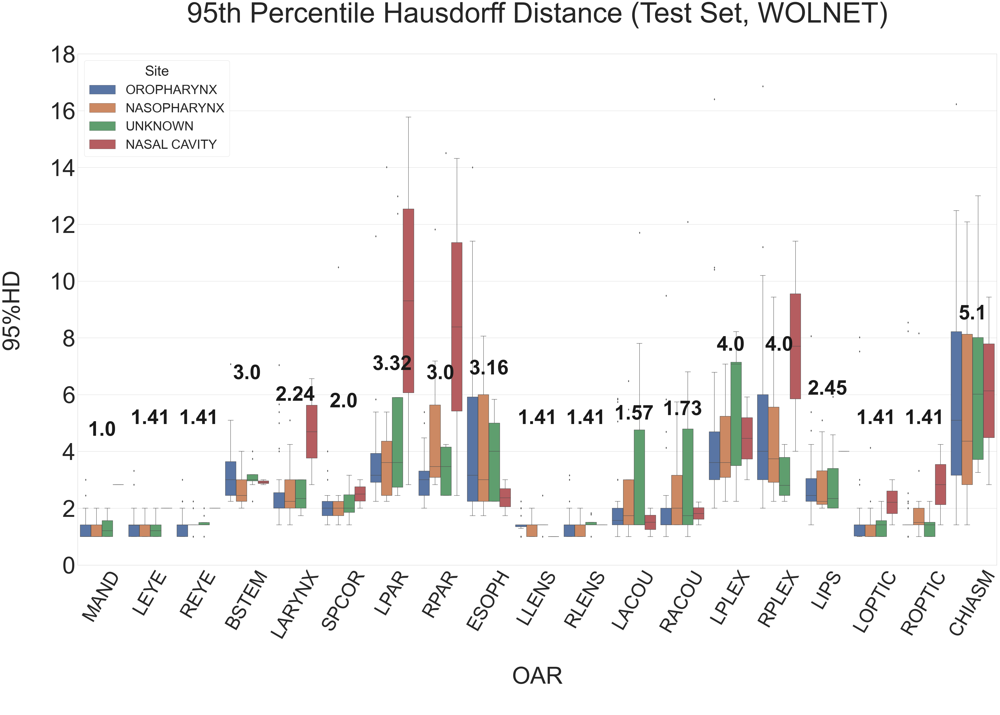

In [66]:
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('95th Percentile Hausdorff Distance (Test Set, WOLNET)\n', fontsize=120)
ax = sea.boxplot(data=data_[data_["95HD"]<17.5], x="OAR", y="95HD", hue="Site", width=.9,)
ax.set_ylim(0,18)
ax.set_yticklabels(ax.get_yticks(), size = 100)
ax.set_xticklabels(rois, rotation=60, fontsize=80)
ylabels = ['{:,.0f}'.format(x) for x in ax.get_yticks()]
ax.set_yticklabels(ylabels)
medians = data_.groupby(['OAR'])['95HD'].median()
vertical_offset = data_['95HD'].median() * 1.65 # offset from median for display
for xtick in ax.get_xticks():
    ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
            horizontalalignment='center',size='x-large',color='k',weight='semibold')
# ax.set(xlabel='\nOAR\n', ylabel='95%HD\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('95%HD\n', fontsize=100)
# ax.legend_.remove()

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


Text(0, 0.5, '3D Volumetric Dice\n')

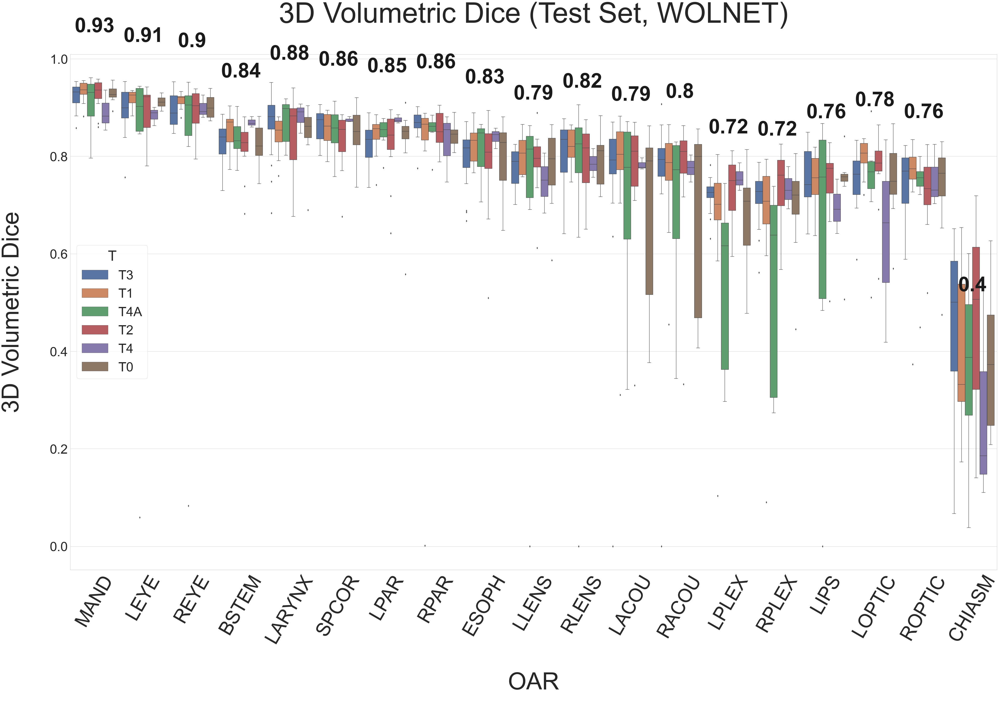

In [62]:
import seaborn as sea
import numpy as np
data_ = r_data.copy()
# CORRECTED ENSEMBLE
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('3D Volumetric Dice (Test Set, WOLNET)\n', fontsize=120)
rois = ['MAND', 'LEYE', 'REYE', 'BSTEM', 'LARYNX', 'SPCOR', 'LPAR', 'RPAR', 'ESOPH', 'LLENS', 'RLENS', 'LACOU', 'RACOU', 'LPLEX', 'RPLEX', 'LIPS', 'LOPTIC', 'ROPTIC', 'CHIASM']
data_.OAR = data_.OAR.astype("category")
data_.OAR.cat.set_categories(rois, inplace=True)
data_.sort_values(["OAR"])
medians = data_.groupby(['OAR'])['VolDice'].median()
vertical_offset = data_['VolDice'].median() * 0.15 # offset from median for display
ax = sea.boxplot(data=data_, x="OAR", y="VolDice", hue="T", width=.9)
ax.set_xticklabels(rois, rotation=60, fontsize=80)
for xtick in ax.get_xticks():
    ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
            horizontalalignment='center',size='x-large',color='k',weight='semibold')
ax.set(xlabel='\nOAR\n', ylabel='3D Volumetric Dice\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('3D Volumetric Dice\n', fontsize=100)
# ax.legend_.remove()

/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/93431442.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), size = 100)
/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_12656/93431442.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabels)


Text(0, 0.5, '95%HD\n')

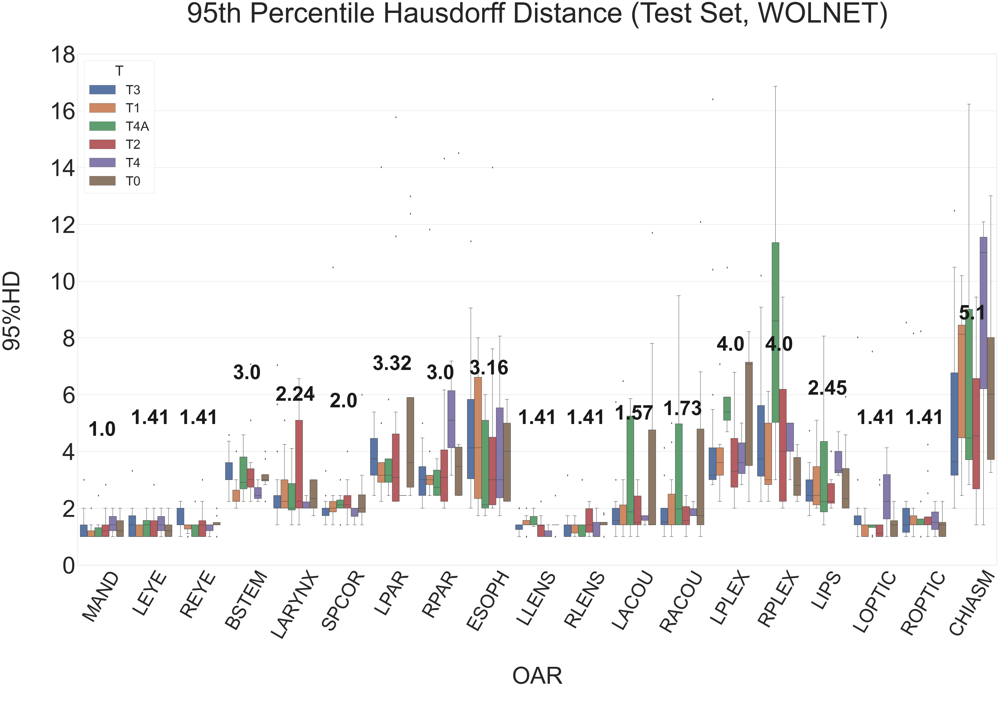

In [67]:
plt.figure(figsize=(70,40))
sea.set(font_scale=5)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set2")
plt.title('95th Percentile Hausdorff Distance (Test Set, WOLNET)\n', fontsize=120)
ax = sea.boxplot(data=data_[data_["95HD"]<17.5], x="OAR", y="95HD", hue="T", width=.9,)
ax.set_ylim(0,18)
ax.set_yticklabels(ax.get_yticks(), size = 100)
ax.set_xticklabels(rois, rotation=60, fontsize=80)
ylabels = ['{:,.0f}'.format(x) for x in ax.get_yticks()]
ax.set_yticklabels(ylabels)
medians = data_.groupby(['OAR'])['95HD'].median()
vertical_offset = data_['95HD'].median() * 1.65 # offset from median for display
for xtick in ax.get_xticks():
    ax.text(xtick,medians[xtick] + vertical_offset, np.round(medians[xtick],2), 
            horizontalalignment='center',size='x-large',color='k',weight='semibold')
# ax.set(xlabel='\nOAR\n', ylabel='95%HD\n')
ax.set_xlabel('\nOAR\n', fontsize=100)
ax.set_ylabel('95%HD\n', fontsize=100)
# ax.legend_.remove()

In [6]:
exclude = ['0522c0727b', '0522c0727a']
d_data = d_data[~d_data.Patient.isin(exclude)]
exclude = ['Spinal-Canal']
d_data = d_data[~d_data.OAR_Deepmind.isin(exclude)]

In [6]:
exclude = ['Mid_Ear_L', 'Mid_Ear_R']
s_data = s_data[~s_data.OAR_STRUCT.isin(exclude)]

In [7]:
rois = ['MAND', 'LEYE', 'REYE', 'BSTEM', 'LARYNX', 'SPCOR', 'LPAR', 'RPAR', 'ESOPH', 'LLENS', 'RLENS', 'LOPTIC', 'ROPTIC', 'LIPS','CHIASM']

In [8]:
import seaborn as sea

In [9]:
d_data.head()

,OAR,OAR_Deepmind,Patient,VolDice,95HD,SurfDice,Observer
0,BSTEM,Brainstem,0522c0427,0.791135,3.162278,1.596496,radiographer
1,LLENS,Lens-Lt,0522c0427,0.615385,1.648528,0.873513,radiographer
2,RLENS,Lens-Rt,0522c0427,0.532423,2.000000,1.105801,radiographer
3,MAND,Mandible,0522c0427,0.857699,2.000000,0.816564,radiographer
4,LOPTIC,Optic-Nerve-Lt,0522c0427,0.514573,6.352054,1.576920,radiographer


In [10]:
import numpy as np
# sorted_ = h_data.groupby('OAR', as_index=True)['OAR']
# np.array(sorted_.count())
# # sorted_.count()
# median_h['Counts'] = sorted_.count()

In [11]:
# calculate number of pateints..


In [12]:
# Getting median values of each dataset
median_p =p_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()
observer = ['pddca_radiographer' for p in range(len(median_p))]
std = p_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].std()
median_p['VolDice_std'] = std['VolDice']
median_p['95HD_std'] = std['95HD']
median_p['SurfDice_std'] = std['SurfDice']
median_p['Observer'] = observer
sorted_ = p_data.groupby('OAR', as_index=True)['OAR']
median_p['Counts'] = np.array(sorted_.count())
####
median_h = h_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()
observer = ['hn3d_radiographer' for p in range(len(median_h))]
std = h_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].std()
median_h['VolDice_std'] = std['VolDice']
median_h['95HD_std'] = std['95HD']
median_h['SurfDice_std'] = std['SurfDice']
median_h['Observer'] = observer
sorted_ = h_data.groupby('OAR', as_index=True)['OAR']
median_h['Counts'] = np.array(sorted_.count())
#####
median_m = m_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()
observer = ['hn1_radiographer' for p in range(len(median_m))]
std = m_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].std()
median_m['VolDice_std'] = std['VolDice']
median_m['95HD_std'] = std['95HD']
median_m['SurfDice_std'] = std['SurfDice']
median_m['Observer'] = observer
sorted_ = m_data.groupby('OAR', as_index=True)['OAR']
median_m['Counts'] = np.array(sorted_.count())
####
median_r = r_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()
observer = ['rad_radiographer' for p in range(len(median_r))]
std = r_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].std()
median_r['VolDice_std'] = std['VolDice']
median_r['95HD_std'] = std['95HD']
median_r['SurfDice_std'] = std['SurfDice']
median_r['Observer'] = observer
sorted_ = r_data.groupby('OAR', as_index=True)['OAR']
median_r['Counts'] = np.array(sorted_.count())
###
median_s = s_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()
observer = ['stseg_radiographer' for p in range(len(median_s))]
std = s_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].std()
median_s['VolDice_std'] = std['VolDice']
median_s['95HD_std'] = std['95HD']
median_s['SurfDice_std'] = std['SurfDice']
median_s['Observer'] = observer
sorted_ = s_data.groupby('OAR', as_index=True)['OAR']
median_s['Counts'] = np.array(sorted_.count())
###
median_d1 = d_data[d_data['Observer']!='radiographer'].groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()
observer = ['dm_oncologist' for p in range(len(median_d1))]
std = d_data[d_data['Observer']!='radiographer'].groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].std()
median_d1['VolDice_std'] = std['VolDice']
median_d1['95HD_std'] = std['95HD']
median_d1['SurfDice_std'] = std['SurfDice']
median_d1['Observer'] = observer
sorted_ = d_data[d_data['Observer']!='radiographer'].groupby('OAR', as_index=True)['OAR']
median_d1['Counts'] = np.array(sorted_.count())
median_d2 = d_data[d_data['Observer']!='oncologist'].groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()
observer = ['dm_radiographer' for p in range(len(median_d2))]
std = d_data[d_data['Observer']!='oncologist'].groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].std()
median_d2['VolDice_std'] = std['VolDice']
median_d2['95HD_std'] = std['95HD']
median_d2['SurfDice_std'] = std['SurfDice']
median_d2['Observer'] = observer
sorted_ = d_data[d_data['Observer']!='oncologist'].groupby('OAR', as_index=True)['OAR']
median_d2['Counts'] = np.array(sorted_.count())
###
median_t = t_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].median()
observer = ['hnscc_radiographer' for p in range(len(median_t))]
std = t_data.groupby('OAR', as_index=False)[['VolDice', '95HD', 'SurfDice']].std()
median_t['VolDice_std'] = std['VolDice']
median_t['95HD_std'] = std['95HD']
median_t['SurfDice_std'] = std['SurfDice']
median_t['Observer'] = observer
sorted_ = t_data.groupby('OAR', as_index=True)['OAR']
median_t['Counts'] = np.array(sorted_.count())

In [13]:
s_data[s_data['OAR']=='RACOU'].median()

/var/folders/4n/x4ks02rx2g9925jn6xb07jkw0000gn/T/ipykernel_2201/1793552043.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  s_data[s_data['OAR']=='RACOU'].median()


Patient     25.500000
VolDice      0.632490
95HD         3.734852
SurfDice     0.782584
dtype: float64

In [15]:
std = h_data.groupby('OAR', as_index=False)[['VolDice', '95HD']].std()

In [16]:
data_median = pd.concat([median_r, median_s, median_d1, median_d2,median_p,median_m,median_h, median_t])

In [17]:
data_median.to_csv('/Users/joemarsilla/Median_Performance_External_validation_02122022.csv')

In [18]:
data_median

,OAR,VolDice,95HD,SurfDice,VolDice_std,95HD_std,SurfDice_std,Observer,Counts
0,BSTEM,0.839614,3.000000,1.249724,0.046400,0.883294,0.407904,rad_radiographer,59
1,CHIASM,0.401028,5.099020,1.238545,0.183534,3.943288,1.468696,rad_radiographer,59
2,ESOPH,0.827362,3.162278,1.070790,0.071651,5.481063,0.570488,rad_radiographer,59
3,LACOU,0.791837,1.573132,0.670757,0.174297,9.785202,8.414200,rad_radiographer,59
4,LARYNX,0.876082,2.236068,0.922978,0.061593,1.379823,1.484772,rad_radiographer,59
...,...,...,...,...,...,...,...,...,...
12,REYE,0.844058,2.118034,0.890737,0.031021,0.205671,0.145938,hnscc_radiographer,10
13,RLENS,0.700596,1.866025,0.701192,0.168472,14.371570,13.598675,hnscc_radiographer,20
14,ROPTIC,0.608549,4.614235,0.747462,0.197963,14.173320,12.396379,hnscc_radiographer,10
15,RPAR,0.791057,5.162156,1.735195,0.103679,4.253386,0.849257,hnscc_radiographer,126


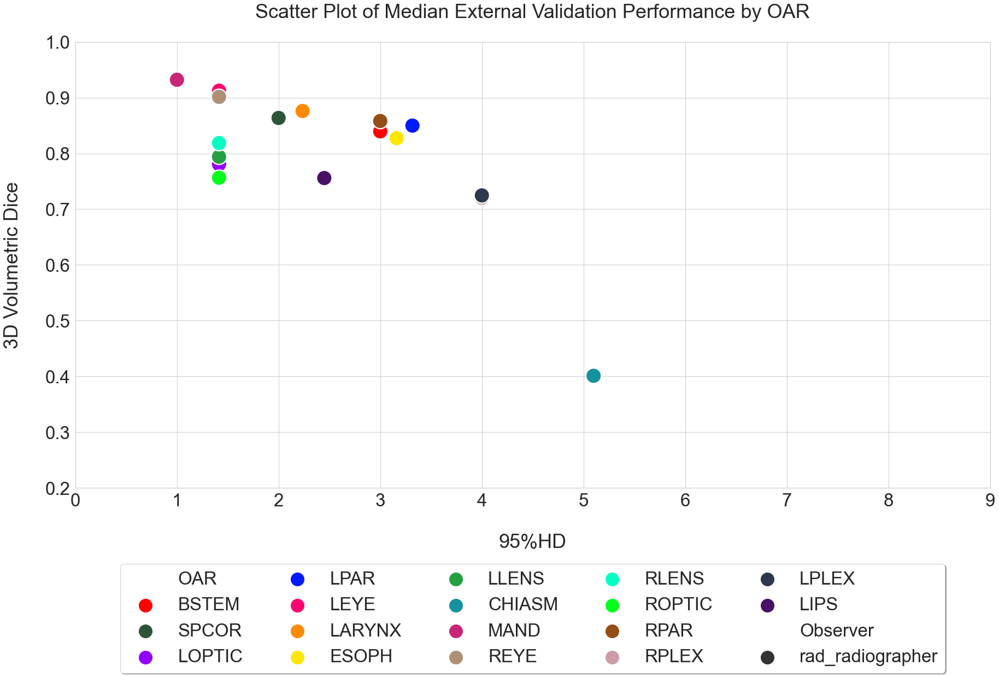

In [345]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.set_style("whitegrid")
# list of # colours...
colors  = ['#ff0000', '#2c5438', '#9400ff', '#0019ff', '#ff006e', '#ff8c00',
           '#ffe500', '#24a041', '#14929e', '#c92677', '#af9077', '#00ffc3',
           '#00ff1d', '#934f17', '#cc9da8', '#2d384f', '#481166', "#ebff16", '#19ff00']
sea.set_palette(sea.color_palette(colors))
sea.color_palette()
plt.title('Scatter Plot of Median External Validation Performance by OAR\n')
plt.ylim(0.2, 1.0)
plt.xlim(0,9)
plt.ylabel('3D Volumetric Dice\n')
plt.xlabel('\n95%HD')
exclude = ['LACOU', 'RACOU']
data_ = data_median[~data_median.OAR.isin(exclude)]
data_ = data_.sort_values(by=['Counts'])
include = ['rad_radiographer']
data_ = data_[data_.Observer.isin(include)]
# sizes = data_.groupby('OAR', as_index=False)['Counts'].sum()
# get sizes 
# obs = list(data_['Observer'])
# obu = list(data_['Observer'].unique())
# data_['Counts']*=100
g = sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# lh.set_sizes([50])
leg = g.legend(markerscale=4, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=5) #'lower center', bbox_to_anchor=(-0.15, -.10))
# for i, val in enumerate(leg.legendHandles):
#     val.set_markersize(50)

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


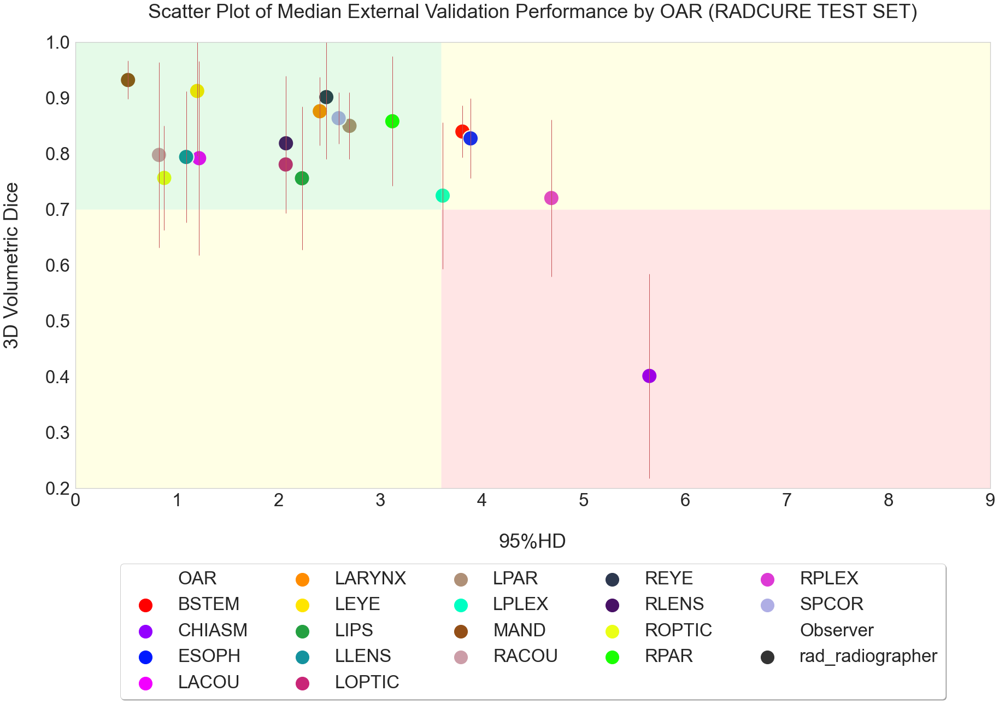

In [399]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.set_style("whitegrid")
# list of # colours...
colors  = ['#ff0000', '#9400ff', '#0019ff', '#f200ff', '#ff8c00',
           '#ffe500', '#24a041', '#14929e', '#c92677', '#af9077', '#00ffc3',
           '#934f17', '#cc9da8', '#2d384f', '#481166', "#ebff16", '#19ff00',
           "#dd39d5", '#afaee5', '#b77b7b']
# colors.sort()
sea.set_palette(sea.color_palette(colors))
sea.color_palette()
plt.title('Scatter Plot of Median External Validation Performance by OAR (RADCURE TEST SET)\n')
plt.ylim(0.2, 1.0)
plt.xlim(0,9)
plt.ylabel('3D Volumetric Dice\n')
plt.xlabel('\n95%HD')
exclude = []
data_ = data_median[~data_median.OAR.isin(exclude)]
include = ['rad_radiographer']
data_ = data_[data_.Observer.isin(include)]
data_.sort_values(["95HD"])
data_['95HD'] = jitter(np.array(data_['95HD']), 0)
data_.Observer = data_.Observer.astype("category")
data_.Observer.cat.set_categories(include, inplace=True)
data_.sort_values(["Observer"])
# data_.Observer = data_.Observer.astype("category")
# data_.Observer.sort(include, inplace=True)
# include = list(data_[data_['Observer']=='hn3d_radiographer']['OAR'].unique())
# data_ = data_[data_.OAR.isin(include)]


# sizes = data_.groupby('OAR', as_index=False)['Counts'].sum()
# get sizes 
# obs = list(data_['Observer'])
# obu = list(data_['Observer'].unique())
# data_['Counts']*=100
data_['95HD'] = jitter(np.array(data_['95HD']), .15)
# data_['VolDice'] = jitter(np.array(data_['VolDice']), .1)
plt.errorbar(x=data_['95HD'], y=data_['VolDice'], yerr=data_['VolDice_std'], linestyle='', color='r', linewidth=1)
g = sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# lh.set_sizes([50])
g.grid()
# g.margins(0) # remove default margins (matplotlib verision 2+)
g.axhspan(.7, 1., xmin=0.0,xmax=.4,facecolor='#00d326', alpha=.1)
g.axhspan(.7, 1., xmin=0.4,xmax=1., facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.0,xmax=.4,facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.4,xmax=1., facecolor='#ff0000', alpha=.1)
#, xerr=data_['95HD_std'])
# ax.axhspan(9, 12, facecolor='red', alpha=0.5)
leg = g.legend(markerscale=4, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=5) #'lower center', bbox_to_anchor=(-0.15, -.10))
# for i, val in enumerate(leg.legendHandles):
#     val.set_markersize(50)

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


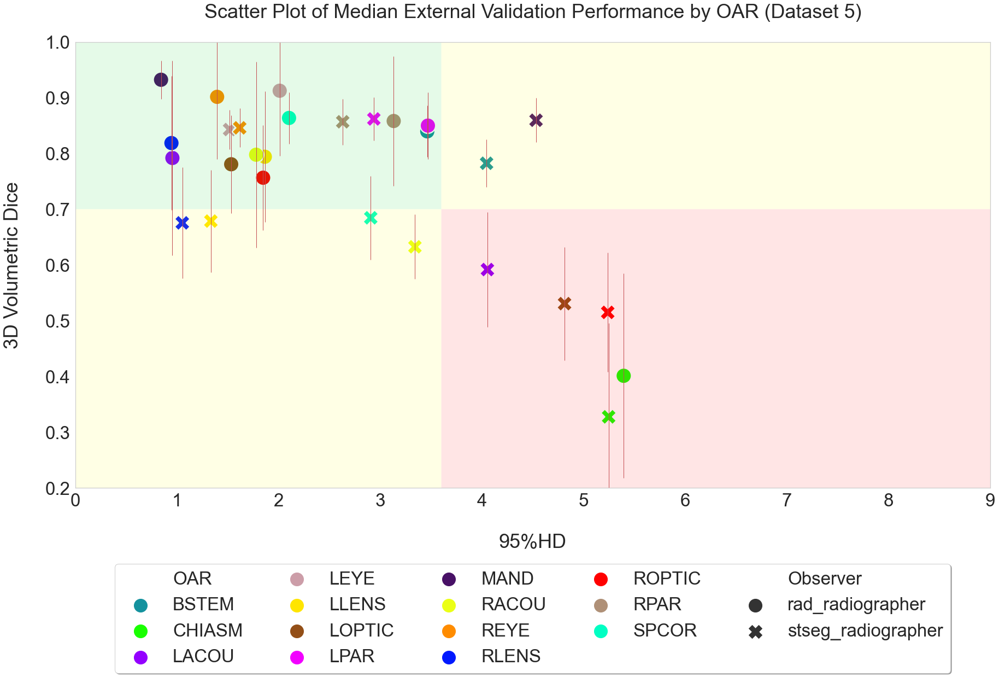

In [407]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.set_style("whitegrid")
# list of # colours...
colors  = ['#ff0000', '#9400ff', '#0019ff', '#f200ff', '#ff8c00',
           '#ffe500', '#24a041', '#14929e', '#c92677', '#af9077', '#00ffc3',
           '#934f17', '#cc9da8', '#2d384f', '#481166', "#ebff16", '#19ff00',
           "#dd39d5", '#afaee5', '#b77b7b']
import random
random.shuffle(colors)
sea.set_palette(sea.color_palette(colors))
sea.color_palette()
plt.title('Scatter Plot of Median External Validation Performance by OAR (Dataset 5)\n')
plt.ylim(0.2, 1.0)
plt.xlim(0,9)
plt.ylabel('3D Volumetric Dice\n')
plt.xlabel('\n95%HD')
exclude = []
data_ = data_median[~data_median.OAR.isin(exclude)]
include = ['rad_radiographer', 'stseg_radiographer']
data_ = data_[data_.Observer.isin(include)]
data_.sort_values(["95HD"])
data_['95HD'] = jitter(np.array(data_['95HD']), 0)
data_.Observer = data_.Observer.astype("category")
data_.Observer.cat.set_categories(include, inplace=True)
data_.sort_values(["Observer"])
# data_.Observer = data_.Observer.astype("category")
# data_.Observer.sort(include, inplace=True)
include = list(data_[data_['Observer']=='stseg_radiographer']['OAR'].unique())
data_ = data_[data_.OAR.isin(include)]


# sizes = data_.groupby('OAR', as_index=False)['Counts'].sum()
# get sizes 
# obs = list(data_['Observer'])
# obu = list(data_['Observer'].unique())
# data_['Counts']*=100
# data_['95HD'] = jitter(np.array(data_['95HD']), .15)
# data_['VolDice'] = jitter(np.array(data_['VolDice']), .1)
plt.errorbar(x=data_['95HD'], y=data_['VolDice'], yerr=data_['VolDice_std'], linestyle='', color='r', linewidth=1)
g = sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# lh.set_sizes([50])
g.grid()
# g.margins(0) # remove default margins (matplotlib verision 2+)
g.axhspan(.7, 1., xmin=0.0,xmax=.4,facecolor='#00d326', alpha=.1)
g.axhspan(.7, 1., xmin=0.4,xmax=1., facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.0,xmax=.4,facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.4,xmax=1., facecolor='#ff0000', alpha=.1)
#, xerr=data_['95HD_std'])
# ax.axhspan(9, 12, facecolor='red', alpha=0.5)
leg = g.legend(markerscale=4, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=5) #'lower center', bbox_to_anchor=(-0.15, -.10))
# for i, val in enumerate(leg.legendHandles):
#     val.set_markersize(50)

In [21]:
np.random.seed(20)
def jitter(values,j):
    return values + np.random.normal(j,.4,values.shape)

In [338]:
# # Cusotm sort pandas dataframe
# d.MODEL = d.MODEL.astype("category")
# order=['RSANET', 'DENSEVOX', 'HIGHRESNET', 'TIRAMUSU',  'PIPOFAN', 'RESUNET', 'ANATOMY', 'VNET', 'UNET++', 'UNET3+DEEPSUP', "WOLNET"]
# order.reverse()
# d.MODEL.cat.set_categories(order, inplace=True)
# d.sort_values(["MODEL"])

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


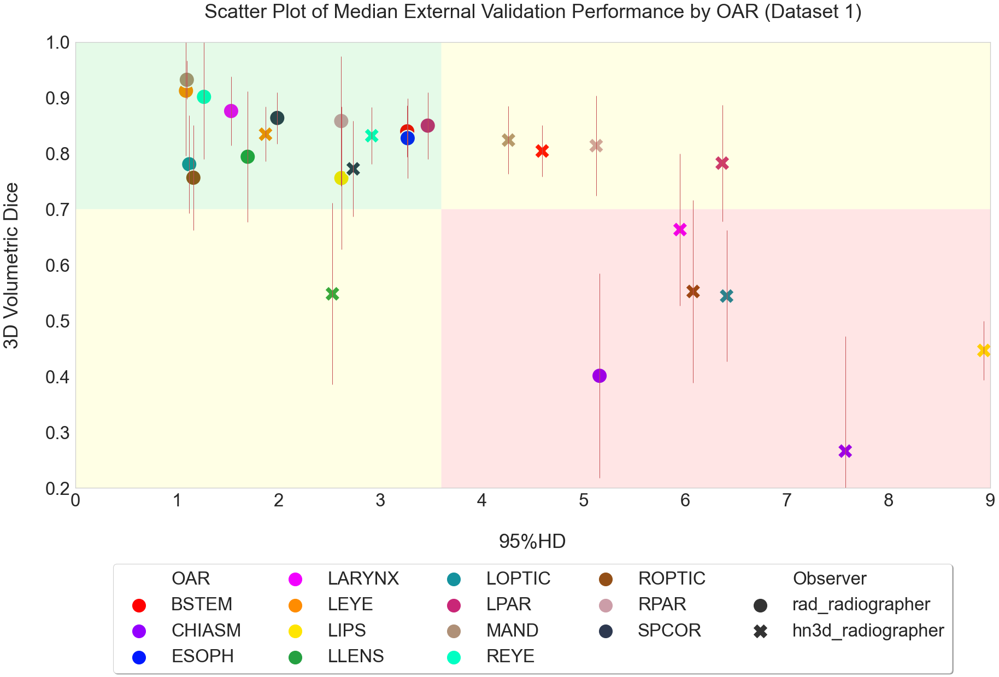

In [339]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.set_style("whitegrid")
# list of # colours...
colors  = ['#ff0000', '#9400ff', '#0019ff', '#f200ff', '#ff8c00',
           '#ffe500', '#24a041', '#14929e', '#c92677', '#af9077', '#00ffc3',
           '#934f17', '#cc9da8', '#2d384f', '#481166', "#ebff16", '#19ff00',
           "#dd39d5", '#afaee5', '#b77b7b']
# colors.sort()
sea.set_palette(sea.color_palette(colors))
sea.color_palette()
plt.title('Scatter Plot of Median External Validation Performance by OAR (Dataset 1)\n')
plt.ylim(0.2, 1.0)
plt.xlim(0,9)
plt.ylabel('3D Volumetric Dice\n')
plt.xlabel('\n95%HD')
exclude = ['LACOU', 'RACOU']
data_ = data_median[~data_median.OAR.isin(exclude)]
include = ['rad_radiographer', 'hn3d_radiographer']
data_ = data_[data_.Observer.isin(include)]
data_.sort_values(["95HD"])
data_['95HD'] = jitter(np.array(data_['95HD']), 0)
data_.Observer = data_.Observer.astype("category")
data_.Observer.cat.set_categories(include, inplace=True)
data_.sort_values(["Observer"])
# data_.Observer = data_.Observer.astype("category")
# data_.Observer.sort(include, inplace=True)
include = list(data_[data_['Observer']=='hn3d_radiographer']['OAR'].unique())
data_ = data_[data_.OAR.isin(include)]


# sizes = data_.groupby('OAR', as_index=False)['Counts'].sum()
# get sizes 
# obs = list(data_['Observer'])
# obu = list(data_['Observer'].unique())
# data_['Counts']*=100
# data_['95HD'] = jitter(np.array(data_['95HD']), .15)
# data_['VolDice'] = jitter(np.array(data_['VolDice']), .1)
plt.errorbar(x=data_['95HD'], y=data_['VolDice'], yerr=data_['VolDice_std'], linestyle='', color='r', linewidth=1)
g = sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# lh.set_sizes([50])
g.grid()
# g.margins(0) # remove default margins (matplotlib verision 2+)
g.axhspan(.7, 1., xmin=0.0,xmax=.4,facecolor='#00d326', alpha=.1)
g.axhspan(.7, 1., xmin=0.4,xmax=1., facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.0,xmax=.4,facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.4,xmax=1., facecolor='#ff0000', alpha=.1)
#, xerr=data_['95HD_std'])
# ax.axhspan(9, 12, facecolor='red', alpha=0.5)
leg = g.legend(markerscale=4, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=5) #'lower center', bbox_to_anchor=(-0.15, -.10))
# for i, val in enumerate(leg.legendHandles):
#     val.set_markersize(50)

In [331]:
np.random.seed(20)
def jitter(values,j):
    return values + np.random.normal(j,.7,values.shape)

In [332]:
np.random.normal(0.,0.4,10)

array([ 0.35355725,  0.07834601,  0.14301461, -0.93730476, -0.43393303,
        0.22387852,  0.37578774, -0.39139242,  0.20123874,  0.16256579])

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


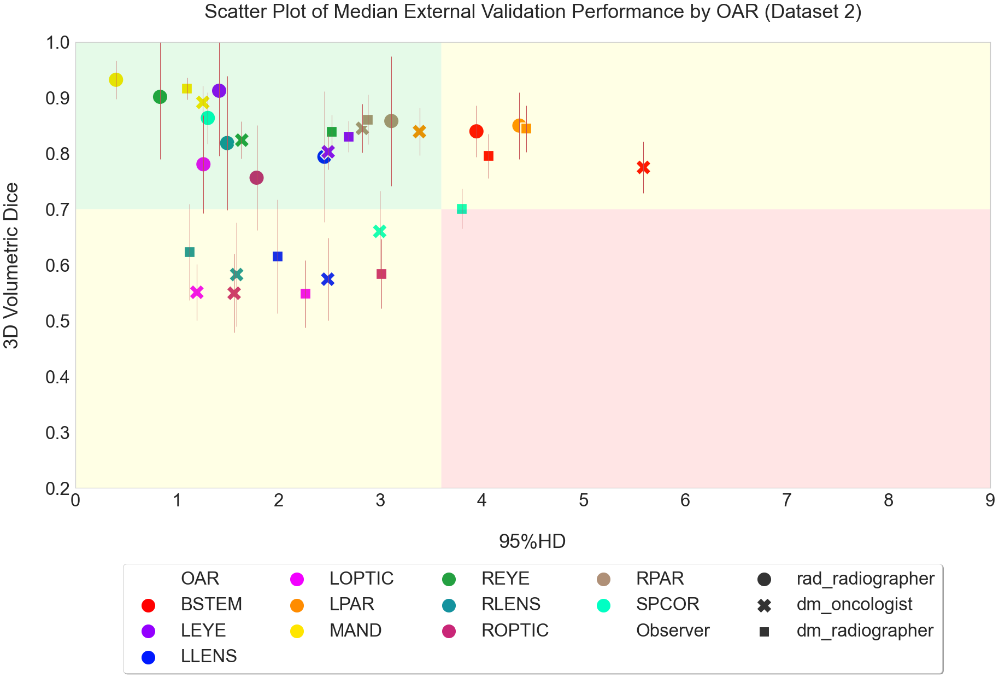

In [334]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.set_style("whitegrid")
# list of # colours...
colors  = ['#ff0000', '#9400ff', '#0019ff', '#f200ff', '#ff8c00',
           '#ffe500', '#24a041', '#14929e', '#c92677', '#af9077', '#00ffc3',
           '#934f17', '#cc9da8', '#2d384f', '#481166', "#ebff16", '#19ff00',
           "#dd39d5", '#afaee5', '#b77b7b']
# colors.sort()
sea.set_palette(sea.color_palette(colors))
sea.color_palette()
plt.title('Scatter Plot of Median External Validation Performance by OAR (Dataset 2)\n')
plt.ylim(0.2, 1.0)
plt.xlim(0,9)
plt.ylabel('3D Volumetric Dice\n')
plt.xlabel('\n95%HD')
exclude = ['LACOU', 'RACOU']
data_ = data_median[~data_median.OAR.isin(exclude)]
include = ['rad_radiographer', 'dm_oncologist','dm_radiographer']
data_ = data_[data_.Observer.isin(include)]
data_.sort_values(["95HD"])
data_['95HD'] = jitter(np.array(data_['95HD']), 0)
data_.Observer = data_.Observer.astype("category")
data_.Observer.cat.set_categories(include, inplace=True)
data_.sort_values(["Observer"])
inc = ['dm_oncologist','dm_radiographer']
include = list(data_[data_.Observer.isin(inc)]['OAR'].unique())
data_ = data_[data_.OAR.isin(include)]

# data_.Observer = df.Tm.astype("category")
# data_.Observer.set_categories(include, inplace=True)
# sizes = data_.groupby('OAR', as_index=False)['Counts'].sum()
# get sizes 
# obs = list(data_['Observer'])
# obu = list(data_['Observer'].unique())
# data_['Counts']*=100
# data_['95HD'] = jitter(np.array(data_['95HD']), .9)
# data_['VolDice'] = jitter(np.array(data_['VolDice']), .1)
plt.errorbar(x=data_['95HD'], y=data_['VolDice'], yerr=data_['VolDice_std'], linestyle='', color='r', linewidth=1)
g = sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# lh.set_sizes([50])
g.grid()
# g.margins(0) # remove default margins (matplotlib verision 2+)
g.axhspan(.7, 1., xmin=0.0,xmax=.4,facecolor='#00d326', alpha=.1)
g.axhspan(.7, 1., xmin=0.4,xmax=1., facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.0,xmax=.4,facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.4,xmax=1., facecolor='#ff0000', alpha=.1)
#, xerr=data_['95HD_std'])
# ax.axhspan(9, 12, facecolor='red', alpha=0.5)
leg = g.legend(markerscale=4, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=5) #'lower center', bbox_to_anchor=(-0.15, -.10))
# for i, val in enumerate(leg.legendHandles):
#     val.set_markersize(50)

In [308]:
np.random.seed(20)
def jitter(values,j):
    return values + np.random.normal(j,.6,values.shape)

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


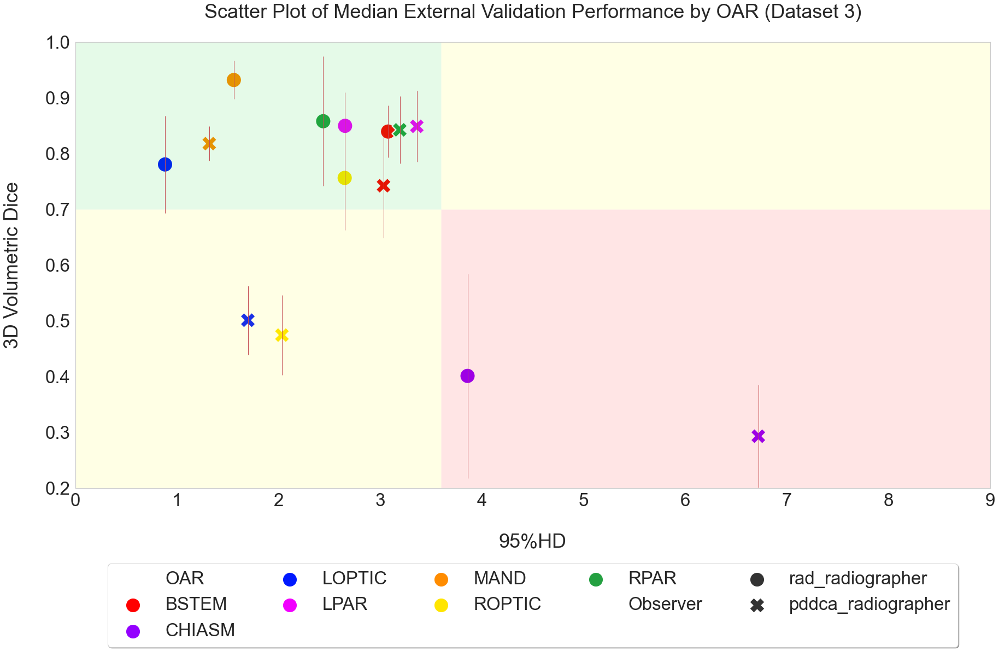

In [311]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.set_style("whitegrid")
# list of # colours...
colors  = ['#ff0000', '#9400ff', '#0019ff', '#f200ff', '#ff8c00',
           '#ffe500', '#24a041', '#14929e', '#c92677', '#af9077', '#00ffc3',
           '#934f17', '#cc9da8', '#2d384f', '#481166', "#ebff16", '#19ff00',
           "#dd39d5", '#afaee5', '#b77b7b']
# colors.sort()
sea.set_palette(sea.color_palette(colors))
sea.color_palette()
plt.title('Scatter Plot of Median External Validation Performance by OAR (Dataset 3)\n')
plt.ylim(0.2, 1.0)
plt.xlim(0,9)
plt.ylabel('3D Volumetric Dice\n')
plt.xlabel('\n95%HD')
exclude = ['LACOU', 'RACOU']
data_ = data_median[~data_median.OAR.isin(exclude)]
include = ['rad_radiographer', 'pddca_radiographer']
data_ = data_[data_.Observer.isin(include)]
data_.Observer = data_.Observer.astype("category")
data_.Observer.cat.set_categories(include, inplace=True)
data_.sort_values(["Observer"])
inc = ['pddca_radiographer']
include = list(data_[data_.Observer.isin(inc)]['OAR'].unique())
data_ = data_[data_.OAR.isin(include)]

# data_.Observer = df.Tm.astype("category")
# data_.Observer.set_categories(include, inplace=True)
# sizes = data_.groupby('OAR', as_index=False)['Counts'].sum()
# get sizes 
# obs = list(data_['Observer'])
# obu = list(data_['Observer'].unique())
# data_['Counts']*=100
data_['95HD'] = jitter(np.array(data_['95HD']), .0)
# data_['VolDice'] = jitter(np.array(data_['VolDice']), .1)
plt.errorbar(x=data_['95HD'], y=data_['VolDice'], yerr=data_['VolDice_std'], linestyle='', color='r', linewidth=1)
g = sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# lh.set_sizes([50])
g.grid()
# g.margins(0) # remove default margins (matplotlib verision 2+)
g.axhspan(.7, 1., xmin=0.0,xmax=.4,facecolor='#00d326', alpha=.1)
g.axhspan(.7, 1., xmin=0.4,xmax=1., facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.0,xmax=.4,facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.4,xmax=1., facecolor='#ff0000', alpha=.1)
#, xerr=data_['95HD_std'])
# ax.axhspan(9, 12, facecolor='red', alpha=0.5)
leg = g.legend(markerscale=4, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=5) #'lower center', bbox_to_anchor=(-0.15, -.10))
# for i, val in enumerate(leg.legendHandles):
#     val.set_markersize(50)

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


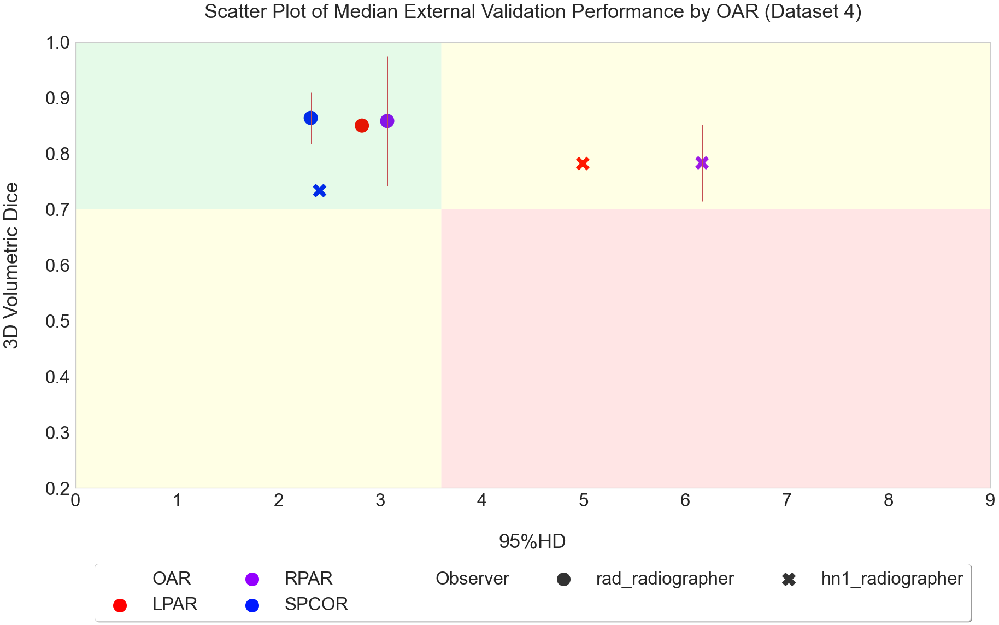

In [317]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.set_style("whitegrid")
# list of # colours...
colors  = ['#ff0000', '#9400ff', '#0019ff', '#f200ff', '#ff8c00',
           '#ffe500', '#24a041', '#14929e', '#c92677', '#af9077', '#00ffc3',
           '#934f17', '#cc9da8', '#2d384f', '#481166', "#ebff16", '#19ff00',
           "#dd39d5", '#afaee5', '#b77b7b']
# colors.sort()
sea.set_palette(sea.color_palette(colors))
sea.color_palette()
plt.title('Scatter Plot of Median External Validation Performance by OAR (Dataset 4)\n')
plt.ylim(0.2, 1.0)
plt.xlim(0,9)
plt.ylabel('3D Volumetric Dice\n')
plt.xlabel('\n95%HD')
exclude = ['LACOU', 'RACOU']
data_ = data_median[~data_median.OAR.isin(exclude)]
include = ['rad_radiographer', 'hn1_radiographer']
data_ = data_[data_.Observer.isin(include)]
data_.Observer = data_.Observer.astype("category")
data_.Observer.cat.set_categories(include, inplace=True)
data_.sort_values(["Observer"])
inc = ['hn1_radiographer']
include = list(data_[data_.Observer.isin(inc)]['OAR'].unique())
data_ = data_[data_.OAR.isin(include)]

# data_.Observer = df.Tm.astype("category")
# data_.Observer.set_categories(include, inplace=True)
# sizes = data_.groupby('OAR', as_index=False)['Counts'].sum()
# get sizes 
# obs = list(data_['Observer'])
# obu = list(data_['Observer'].unique())
# data_['Counts']*=100
data_['95HD'] = jitter(np.array(data_['95HD']), 0)
# data_['VolDice'] = jitter(np.array(data_['VolDice']), .1)
plt.errorbar(x=data_['95HD'], y=data_['VolDice'], yerr=data_['VolDice_std'], linestyle='', color='r', linewidth=1)
g = sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# lh.set_sizes([50])
g.grid()
# g.margins(0) # remove default margins (matplotlib verision 2+)
g.axhspan(.7, 1., xmin=0.0,xmax=.4,facecolor='#00d326', alpha=.1)
g.axhspan(.7, 1., xmin=0.4,xmax=1., facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.0,xmax=.4,facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.4,xmax=1., facecolor='#ff0000', alpha=.1)
#, xerr=data_['95HD_std'])
# ax.axhspan(9, 12, facecolor='red', alpha=0.5)
leg = g.legend(markerscale=4, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=5) #'lower center', bbox_to_anchor=(-0.15, -.10))
# for i, val in enumerate(leg.legendHandles):
#     val.set_markersize(50)

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


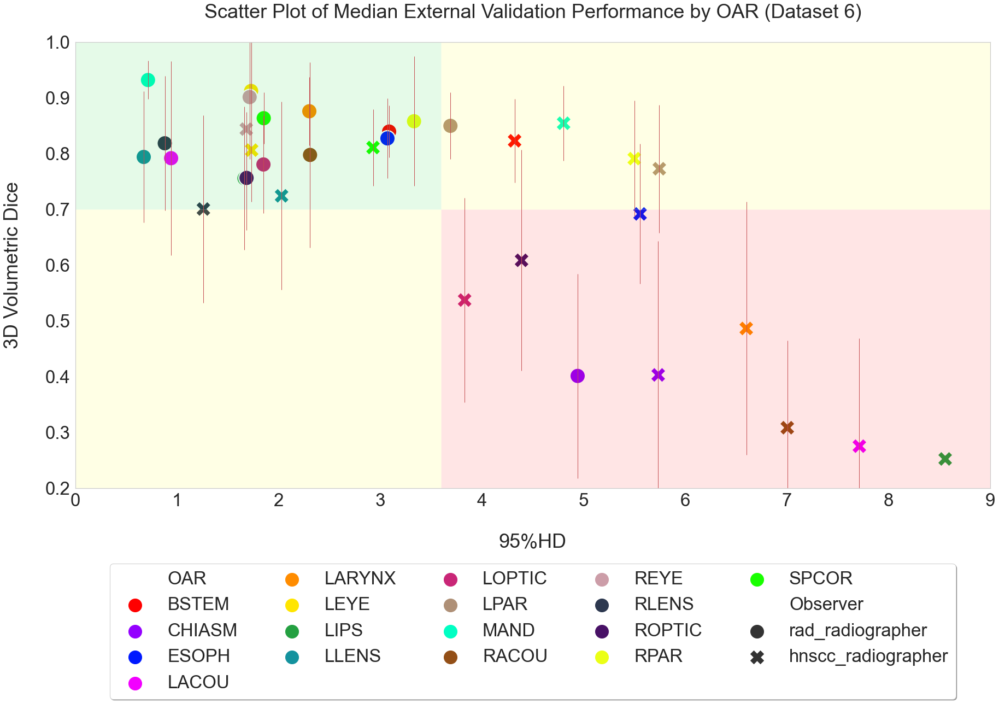

In [25]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3)  # crazy big
sea.set_style("whitegrid")
# list of # colours...
colors  = ['#ff0000', '#9400ff', '#0019ff', '#f200ff', '#ff8c00',
           '#ffe500', '#24a041', '#14929e', '#c92677', '#af9077', '#00ffc3',
           '#934f17', '#cc9da8', '#2d384f', '#481166', "#ebff16", '#19ff00',
           "#dd39d5", '#afaee5', '#b77b7b']
# colors.sort()
sea.set_palette(sea.color_palette(colors))
sea.color_palette()
plt.title('Scatter Plot of Median External Validation Performance by OAR (Dataset 6)\n')
plt.ylim(0.2, 1.0)
plt.xlim(0,9)
plt.ylabel('3D Volumetric Dice\n')
plt.xlabel('\n95%HD')
exclude = [] #['LACOU', 'RACOU']
# data_ = data_median[~data_median.OAR.isin(exclude)]
data_ = data_median[~data_median.OAR.isin(exclude)]
include = ['rad_radiographer', 'hnscc_radiographer']
data_ = data_[data_.Observer.isin(include)]
data_.Observer = data_.Observer.astype("category")
data_.Observer.cat.set_categories(include, inplace=True)
data_.sort_values(["Observer"])
inc = ['hnscc_radiographer']
include = list(data_[data_.Observer.isin(inc)]['OAR'].unique())
data_ = data_[data_.OAR.isin(include)]

# data_.Observer = df.Tm.astype("category")
# data_.Observer.set_categories(include, inplace=True)
# sizes = data_.groupby('OAR', as_index=False)['Counts'].sum()
# get sizes 
# obs = list(data_['Observer'])
# obu = list(data_['Observer'].unique())
# data_['Counts']*=100
data_['95HD'] = jitter(np.array(data_['95HD']), 0)
# data_['VolDice'] = jitter(np.array(data_['VolDice']), .1)
plt.errorbar(x=data_['95HD'], y=data_['VolDice'], yerr=data_['VolDice_std'], linestyle='', color='r', linewidth=1)
g = sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# sea.scatterplot( data=data_, y='VolDice', x='95HD', hue='OAR', style='Observer', s=800)
# lh.set_sizes([50])
g.grid()
# g.margins(0) # remove default margins (matplotlib verision 2+)
g.axhspan(.7, 1., xmin=0.0,xmax=.4,facecolor='#00d326', alpha=.1)
g.axhspan(.7, 1., xmin=0.4,xmax=1., facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.0,xmax=.4,facecolor='#ffff00', alpha=.1)
g.axhspan(0, .7, xmin=0.4,xmax=1., facecolor='#ff0000', alpha=.1)
#, xerr=data_['95HD_std'])
# ax.axhspan(9, 12, facecolor='red', alpha=0.5)
leg = g.legend(markerscale=4, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=5) #'lower center', bbox_to_anchor=(-0.15, -.10))
# for i, val in enumerate(leg.legendHandles):
#     val.set_markersize(50)

In [316]:
include

['LPAR', 'RPAR', 'SPCOR']

In [32]:
########################
# This section reads in .csv and modifies it...
import pandas as pd
data_ = pd.read_csv('/Users/joemarsilla/Median_Performance_External_validation_02122022.csv')

In [33]:
# data_tcia = pd.read_csv('/Users/joemarsilla/ptl-oar-segmentation/paper/csv/OAREnsemble20201_tcia_hnscc_outputv1.csv', index_col=0)

In [35]:
# dat_transposed = dat.T 

In [36]:
# dat_transposed

In [37]:
oars= list(data_.OAR.unique())

In [38]:
len(oars)

19

In [39]:
obs = list(data_.Observer.unique())
oars= list(data_.OAR.unique())
d_c = {'OAR':oars}
for ob in obs:
    d = data_[data_['Observer']==ob]
    dd_c = []
    # dd_h = []
    for oar in oars:
        oa = list(d.OAR.unique())
        if oar in oa:
            dd_c.append(f"{d[d['OAR']==oar]['Counts'].iloc[0]}")
            # dd_h.append(f"{np.round(d[d['OAR']==oar]['95HD'].iloc[0],2)}\u00B1{np.round(d[d['OAR']==oar]['95HD_std'].iloc[0],2)}")
        else:
            dd_c.append('')
            # dd_h.append('')
    d_c[ob] = dd_c
    # d_h[ob] = dd_h

In [40]:
count_dframe = pd.DataFrame.from_dict(d_c)

In [41]:
count_dframe.to_csv('OAR_EXT_VALIDATION_COUNTS.csv')

In [42]:
obs = list(data_.Observer.unique())
oars= list(data_.OAR.unique())

d_v = {'OAR':oars}
d_h = {'OAR':oars}
for ob in obs:
    d = data_[data_['Observer']==ob]
    dd_v = []
    dd_h = []
    for oar in oars:
        oa = list(d.OAR.unique())
        if oar in oa:
            dd_v.append(f"{np.round(d[d['OAR']==oar]['VolDice'].iloc[0],2)}\u00B1{np.round(d[d['OAR']==oar]['VolDice_std'].iloc[0],2)}")
            dd_h.append(f"{np.round(d[d['OAR']==oar]['95HD'].iloc[0],2)}\u00B1{np.round(d[d['OAR']==oar]['95HD_std'].iloc[0],2)}")
        else:
            dd_v.append('')
            dd_h.append('')
    d_v[ob] = dd_v
    d_h[ob] = dd_h

In [43]:
d[d['OAR']==oar]['VolDice'].iloc[0]

0.8109710216522217

In [44]:
d

,Unnamed: 0,OAR,VolDice,95HD,SurfDice,VolDice_std,95HD_std,SurfDice_std,Observer,Counts
83,0,BSTEM,0.823078,4.123106,1.197192,0.075504,2.596939,0.645242,hnscc_radiographer,138
84,1,CHIASM,0.402852,5.618716,0.896901,0.240030,5.698122,0.609761,hnscc_radiographer,13
85,2,ESOPH,0.691857,5.744563,1.874499,0.125556,2.999626,0.885997,hnscc_radiographer,17
86,3,LACOU,0.274981,7.071068,2.967801,0.193792,18.689832,NaN,hnscc_radiographer,50
87,4,LARYNX,0.486217,6.662278,2.994427,0.227048,10.406453,1.328930,hnscc_radiographer,22
88,5,LEYE,0.806301,2.449490,0.930401,0.092737,18.271414,0.115058,hnscc_radiographer,11
89,6,LIPS,0.252028,8.602325,3.452398,NaN,NaN,NaN,hnscc_radiographer,1
90,7,LLENS,0.724234,1.414214,0.635604,0.168813,13.639460,12.843042,hnscc_radiographer,21
91,8,LOPTIC,0.537255,4.242641,0.903371,0.183386,16.599842,11.051765,hnscc_radiographer,11
92,9,LPAR,0.772878,5.787757,1.927356,0.114941,4.641050,1.041706,hnscc_radiographer,122


In [45]:
vol_dframe = pd.DataFrame.from_dict(d_v)

In [47]:
vol_dframe.to_csv('Mean_OAR_3DVoldice_by_dataset_02122021-2.csv')

In [67]:
vol_dframe

OAR                       BSTEM
rad_radiographer      0.84±0.05
stseg_radiographer    0.78±0.04
dm_oncologist         0.77±0.05
dm_radiographer        0.8±0.04
pddca_radiographer    0.74±0.09
hn1_radiographer               
hn3d_radiographer      0.8±0.05
hnscc_radiographer    0.82±0.08
Name: 0, dtype: object

In [48]:
vol_dframe

,OAR,rad_radiographer,stseg_radiographer,dm_oncologist,dm_radiographer,pddca_radiographer,hn1_radiographer,hn3d_radiographer,hnscc_radiographer
0,BSTEM,0.84±0.05,0.78±0.04,0.77±0.05,0.8±0.04,0.74±0.09,,0.8±0.05,0.82±0.08
1,CHIASM,0.4±0.18,0.33±0.17,,,0.29±0.09,,0.27±0.21,0.4±0.24
2,ESOPH,0.83±0.07,,,,,,0.53±0.21,0.69±0.13
3,LACOU,0.79±0.17,0.59±0.1,,,,0.08±0.08,0.18±0.08,0.27±0.19
4,LARYNX,0.88±0.06,,,,,,0.66±0.14,0.49±0.23
5,LEYE,0.91±0.12,0.84±0.04,0.8±0.03,0.83±0.03,,,0.83±0.05,0.81±0.09
6,LIPS,0.76±0.13,,,,,,0.45±0.05,0.25±nan
7,LLENS,0.79±0.12,0.68±0.09,0.57±0.07,0.62±0.1,,,0.55±0.16,0.72±0.17
8,LOPTIC,0.78±0.09,0.53±0.1,0.55±0.05,0.55±0.06,0.5±0.06,,0.54±0.12,0.54±0.18
9,LPAR,0.85±0.06,0.86±0.04,0.84±0.04,0.84±0.04,0.85±0.06,0.78±0.09,0.78±0.1,0.77±0.11


In [49]:
hd_dframe = pd.DataFrame.from_dict(d_h)

In [50]:
hd_dframe

,OAR,rad_radiographer,stseg_radiographer,dm_oncologist,dm_radiographer,pddca_radiographer,hn1_radiographer,hn3d_radiographer,hnscc_radiographer
0,BSTEM,3.0±0.88,3.74±0.85,4.12±0.73,3.74±0.68,4.0±2.16,,4.12±1.77,4.12±2.6
1,CHIASM,5.1±3.94,5.14±3.53,,,6.4±2.62,,7.26±3.75,5.62±5.7
2,ESOPH,3.16±5.48,,,,,,14.21±9.13,5.74±3.0
3,LACOU,1.57±9.79,3.74±1.14,,,,10.1±7.65,9.13±1.93,7.07±18.69
4,LARYNX,2.24±1.38,,,,,,6.0±2.71,6.66±10.41
5,LEYE,1.41±2.98,1.41±0.39,2.24±0.16,2.24±0.15,,,2.83±0.87,2.45±18.27
6,LIPS,2.45±1.21,,,,,,8.6±2.59,8.6±nan
7,LLENS,1.41±0.33,1.41±0.37,2.0±0.31,1.65±0.55,,,2.13±0.92,1.41±13.64
8,LOPTIC,1.41±1.29,5.05±2.19,2.24±1.53,2.24±1.88,2.63±4.44,,6.48±5.28,4.24±16.6
9,LPAR,3.32±3.44,3.0±1.73,3.32±2.77,3.74±5.17,3.16±1.72,4.9±3.52,6.4±4.41,5.79±4.64


In [51]:
hd_dframe.to_csv('Mean_OAR_95HD_by_dataset_02122021-2.csv')

#### colors[9]

In [245]:
data_

,OAR,VolDice,95HD,Observer,Counts
6,LIPS,0.446542,8.602325,hn3d_radiographer,5
7,LLENS,0.548105,2.129837,hn3d_radiographer,9
2,ESOPH,0.531455,14.208267,hn3d_radiographer,12
8,LOPTIC,0.544090,6.480741,hn3d_radiographer,27
13,ROPTIC,0.552312,6.039669,hn3d_radiographer,28
...,...,...,...,...,...
0,BSTEM,0.804331,4.123106,hn3d_radiographer,82
15,SPCOR,0.772322,3.000000,hn3d_radiographer,83
3,RPAR,0.783042,5.385165,hn1_radiographer,93
1,LPAR,0.781793,4.898979,hn1_radiographer,94


In [290]:
plt.figure(figsize=(30,15))
sea.set(font_scale=3) 
d = data_[['OAR','Counts']].reset_index()
sea.heatmap(d)

ValueError: could not convert string to float: 'LIPS'

<Figure size 2160x1080 with 0 Axes>

In [210]:
sizes['Counts']

0     2000
1     1130
2      120
3      470
4     1120
5       50
6      750
7     1450
8     2830
9     1700
10    1150
11     660
12    1460
13    2820
14    2680
Name: Counts, dtype: int64

In [125]:
leg.legendHandles[0]

AttributeError: 'PathCollection' object has no attribute 'marker'

In [61]:
observer = ['pddca_radiologist' for p in range(len(p_data))]
p_data['Observer'] = observer
observer = ['hn3d_radiologist' for p in range(len(h_data))]
h_data['Observer'] = observer
observer = ['hn1_radiologist' for p in range(len(m_data))]
m_data['Observer'] = observer

In [73]:
m_data.head()

,OAR,OAR_HN1,Patient,VolDice,95HD,SurfDice,Observer
0,SPCOR,SPINAL-CORD,HN1006,0.747446,2.236068,1.104181,hn1_radiologist
1,LPAR,PAROTID-LEFT,HN1006,0.830148,3.605551,0.808695,hn1_radiologist
2,RPAR,PAROTID-RIGHT,HN1006,0.819642,4.000000,0.872375,hn1_radiologist
3,LACOU,COCHLEA-LEFT,HN1006,0.145098,10.295630,4.983077,hn1_radiologist
4,RACOU,COCHLEA-RIGHT,HN1006,0.131868,11.443335,5.686941,hn1_radiologist


In [254]:
d = d_data.drop(columns=['OAR_Deepmind'])
p = p_data.drop(columns=['OAR_PDDCA'])
m = m_data.drop(columns=['OAR_HN1'])
h = h_data.copy()

In [255]:
data = pd.concat([r_data,d,p,m,h])

In [264]:
data.head()
data['Counts'] = np.ones(len(data))

In [272]:
data = data.drop(columns=['Observer'])

In [141]:
# Calculate number of unique OARs in set...
u_oars = []
n_scans = []
obs = list(data['Observer'].unique())
exclude = ['LACOU', 'RACOU']
data_i = data[~data.OAR.isin(exclude)]
for ob in obs:
    a = data_i[data_i['Observer']==ob]
    u_oars.append((list(a['OAR'].unique()), len(list(a['OAR'].unique()))))
    n_scans.append(len(list(a['Patient'].unique())))

In [153]:
obs.index('radiographer')

0

In [244]:
u_oars

[(['BSTEM',
   'LLENS',
   'RLENS',
   'MAND',
   'LOPTIC',
   'ROPTIC',
   'LPAR',
   'RPAR',
   'LEYE',
   'REYE',
   'SPCOR'],
  11),
 (['BSTEM',
   'LLENS',
   'RLENS',
   'MAND',
   'LOPTIC',
   'ROPTIC',
   'LPAR',
   'RPAR',
   'LEYE',
   'REYE',
   'SPCOR'],
  11),
 (['BSTEM', 'CHIASM', 'MAND', 'LOPTIC', 'ROPTIC', 'LPAR', 'RPAR'], 7),
 (['SPCOR', 'LPAR', 'RPAR'], 3),
 (['BSTEM',
   'SPCOR',
   'MAND',
   'LPAR',
   'RPAR',
   'LOPTIC',
   'ROPTIC',
   'CHIASM',
   'LARYNX',
   'LEYE',
   'REYE',
   'ESOPH',
   'LIPS',
   'LLENS'],
  14)]

In [152]:
list(data_['Observer'].unique())

['dm_oncologist',
 'dm_radiographer',
 'pddca_radiographer',
 'hn1_radiographer',
 'hn3d_radiographer']

In [16]:
import matplotlib.pyplot as plt

In [101]:
data.groupby('OAR', as_index=False)['VolDice'].mean()

,OAR,VolDice
0,BSTEM,0.775480
1,CHIASM,0.281814
2,ESOPH,0.501438
3,LACOU,0.140975
4,LARYNX,0.647580
5,LEYE,0.815717
6,LIPS,0.476387
7,LLENS,0.582139
8,LOPTIC,0.536517
9,LPAR,0.790479


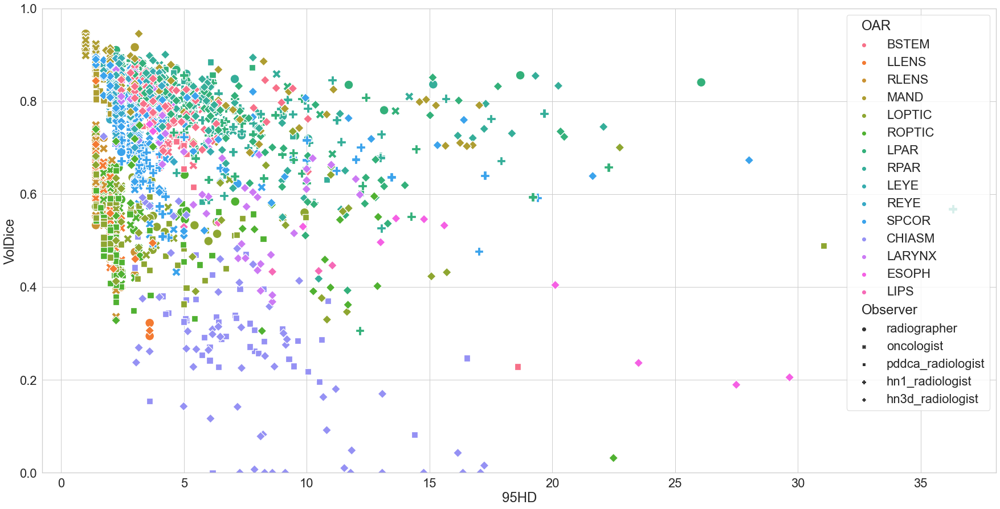

In [100]:
plt.figure(figsize=(30,15))
sea.set(font_scale=2)  # crazy big
sea.set_style("whitegrid")
sea.color_palette("Set1")
plt.ylim(0., 1.0)
exclude = ['LACOU', 'RACOU']
data_ = data[~data.OAR.isin(exclude)]
g = sea.scatterplot( data=data_[data_['95HD']<50], y='VolDice', x='95HD', hue='OAR', style='Observer', s=250)
# g.legend(loc='lower center', bbox_to_anchor=(-0.15, -.10))

In [1]:
import numpy as np
a = np.ones(35)

In [2]:
rois = ["BACKGR", "GTV", "LNECK", "RNECK", "BRAIN", "BSTEM", "SPCOR", "ESOPH", "LARYNX",
        "MAND", "POSTCRI", "LPAR", "RPAR", "LACOU", "RACOU", "LLAC", "RLAC",
        "RRETRO", "LRETRO", "RPLEX", "LPLEX", "LLENS", "RLENS", "LEYE", "REYE",
        "LOPTIC", "ROPTIC", "LSMAN", "RSMAN", "CHIASM", "LIPS", "OCAV", "IPCM",
        "SPCM", "MPCM"]

In [16]:

import random
c = random.choices(np.arange(0,35), k=10)

In [17]:
a[c] = 0

In [18]:
a

array([1., 1., 1., 1., 0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 0.,
       0., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 0.,
       0.])

In [35]:
[rois[s] for s in list(np.where(a == 1)[0])]

['BACKGR',
 'GTV',
 'LNECK',
 'RNECK',
 'SPCOR',
 'ESOPH',
 'LARYNX',
 'MAND',
 'POSTCRI',
 'LPAR',
 'RPAR',
 'RACOU',
 'LLAC',
 'LRETRO',
 'RPLEX',
 'LPLEX',
 'LLENS',
 'RLENS',
 'LEYE',
 'REYE',
 'ROPTIC',
 'LSMAN',
 'RSMAN',
 'CHIASM',
 'OCAV',
 'IPCM']